# AI engine for chess

### This project is best viewed as a Jupyter notebook as converting the notebook to PDF does not properly convert the SVG images of the board into PDF images. 

The goal of my project is to create a chess engine against which one could enjoyably play. My goal will be to make it as strong as possible but I would love for it to be strong enough so I, as someone who plays once every month or so with a rapid rating of around 1900 ELO, would find it enjoyable to play against.  

I will be using the [python-chess](https://python-chess.readthedocs.io/en/latest/) library to handle the chess logic which includes generating the visualization of the chess board, generating the list of legal moves, making them, checking for checkmate, stalemate, etc. This will allow me to focus on the AI part of the project.

Current, state of the art engines of todays which are many times better than todays strongest players (much higher ratings and never losing to them), use varying techniques. Generally, two strongest engines of today, Stockfish  and Leela Chess Zero, use different architectures. Stockfish ([open-source](https://github.com/official-stockfish/Stockfish)), undobtedly the strongest engine of today, uses a traditional alphabeta pruning minimax (yes, the strongest engine of today uses a somewhat traditional technique) with some highly sophisticated heuristics. On the other hand, Leela Chess Zero uses a neural network based approach to evaluate the board position and the Monte Carlo Tree Search (MCTS) to find the best moves. However, the latest versions of Stockfish not only beat Leela in terms of accuracy but are also many, many times faster than Leela, obliterating it when it comes to decision making in limited times. 

Consequently, I will use this project to explore the different techniques used in chess engines, implement them, compare and improve them. I will start with the most fundamental one:
1. making random moves
2. minimax with a piece valuing heuristic
3. minimax with an improved sophisticated piece value heuristic conjoined with positional evaluation heuristic
4. adding alphabeta pruning



Necessary import

In [12]:
try:
    import chess
    import chess.svg
except:
    pip install python-chess
    import chess
    import chess.svg

import random


Before going into the AI engine, we firstly have to write the functions that will be used to generate the chess board, make moves, ask user for input, check if the game is finished, ask who will play first and be able to connect everything and run it in a loop with different engines without having to rwite the same code over and over again. 


In [13]:
def choose_side():
    """Choose the side to play. The user can choose to play as white, black or a random side.

    Returns:
        user_side (str): The side chosen by the user. Can be 'white', 'black' or 'random'.
        is_flipped (bool): True if the board is flipped (when the user is black), False otherwise (when the user is white). 
    """
    user_side = input(
        "Which side do you want to play? Choose 'white', 'black' or 'random': ")
    while user_side not in ['white', 'black', 'random']:
        user_side = input(
            "Invalid input. Choose 'white', 'black' or 'random': ")
    user_side = random.choice(
        ["white", "black"]) if user_side == "random" else user_side
    is_flipped = True if user_side == "black" else False
    return user_side, is_flipped

In [ ]:
def user_side_move(board, move_count, print_moves=True, **kwargs):
    """User side move. The user is asked to enter a move in SAN format which is then played on the board.
    The user can also exit the game ('exit'), print the FEN string of the board ('fen'), 
    print the available moves ('available moves') or undo the last move ('undo').

    Args:
        board (chess.Board): The current state of the board.
        move_count (int): The number of moves played so far.
        print_moves (bool): True if the move played by the user should be printed, False otherwise.

    Returns:
        board (chess.Board): The current state of the board.
        move_count (int): The number of moves played so far.
        user_move (str): The move played by the user.
        from_square (int): The square from which the piece is moved.
        to_square (int): The square to which the piece is moved.
        positions_evaluated: None; We do not evaluate any positions when the user plays a move.
    """

    while True:  # loop until the user enters a valid move or exits the game.
        user_move = input("Your move: \n Type 'exit' to exit the game. \n Type 'fen' to print the FEN string. \n Type 'available moves' to print the available moves. \n Type 'undo' to undo the last move. \n Enter your move: ")
        if user_move.lower() == 'exit':  # exit the game.
            return None, move_count, user_move, None, None, None
        if user_move.lower() == 'fen':  # print the FEN string of the board.
            print(board.fen())
            continue
        # print the available moves.
        if user_move.lower() == 'available moves':
            print(board.legal_moves)
            continue
        if user_move.lower() == 'undo':  # undo the last move.
            # this mean it is still the first move of the game.
            if len(board.move_stack) < 2:
                print("Cannot undo the first move.")
                continue
            else:  # if more than one move has been played, undo the last move.
                board.pop()  # undo the last move from the stack (AI move)
                board.pop()  # undo the last move from the stack (user move)
                print("Last move undone. Current state of the board:")
                move_count -= 1  # decrement the move count by 1.
                if len(board.move_stack) == 0:
                    # if the move stack is empty, it means that we are back to the initial state of the board so no from_square and to_square.
                    return board, move_count, user_move, None, None, None
                else:
                    last_move = board.peek()
                    return board, move_count, user_move, last_move.from_square, last_move.to_square, None
        try:  # try to parse the user move in SAN format.
            # parse the user move in SAN format.
            move = board.parse_san(user_move)
            # check if the user move is in the list of legal moves.
            if move in board.legal_moves:
                board.push(move)  # play the move on the board.
                # print the move played by the user.
                if print_moves:
                    print(f"Move {move_count}: You played {move.uci()}")
                return board, move_count, user_move, move.from_square, move.to_square, None
            else:
                print(
                    f"Invalid move: {move}. Please choose a valid move. You can enter 'available moves' to see the available moves.")
        except ValueError:
            print(
                f"Invalid move: {user_move}. Please choose a valid move. You can enter 'available moves' to see the available moves.")

In [ ]:
def reason_for_game_over(board):
    """Print the reason for which the game is over.

    Args:
        board (chess.Board): The current state of the board.
    """
    if board.is_checkmate():
        print("Checkmate! Black won." if board.turn ==
              chess.WHITE else "Checkmate! White won.")
    elif board.is_stalemate():
        print("Stalemate!")
    elif board.is_insufficient_material():
        print("Insufficient material!")
    elif board.is_seventyfive_moves():
        print("Seventyfive moves rule!")
    elif board.is_fivefold_repetition():
        print("Fivefold repetition rule!")


Below is the main funciton that we will be running with all the different models. We can just pass the different evaluation functions and algorithms as arguments and run it with a single call.

In [15]:
def run_chess_game(ai_opponent_move, evaluate_board_function, initial_board=None, show_num_positions_evaluated=True, depth=3, show_board=True, print_moves=True):
    """ 
    Main function that runs the chess game. The user firstly chooses whether to play as white, black or a random side.
    The game then starts and if the user is white, the user is asked to enter a move in SAN format which is then played on the board.
    The user can also exit the game ('exit'), print the FEN string of the board ('fen'),
    print the available moves ('available moves') or undo the last move ('undo').
    Then, the AI opponent plays a move using its own enginge function passed through ai_opponent_move and the board is updated. 
    The game continues until the game is over or stopped.
    The user can also choose to print out the total number of positions evaluated by the AI opponent as well as choose whether to print
    out the moves and show the board.

    Args:
        ai_opponent_move (function): The function that plays the move for the AI opponent. Can be random, minimax, etc.
        evaluate_board_function (function): The function that evaluates the board. Used by the ai_opponent_move. Can be random, minimax, etc.
        initial_board (str): The initial board in FEN format. If None, the default board is used.
        show_num_positions_evaluated (bool): If True, the number of positions evaluated (nodes visited) by the AI opponents are shown.
        depth (int): The depth of the minimax algorithm. If minimax is not used, this parameter is ignored. Default is 3.  
        show_board (bool): If True, the board is displayed after each move. Default is True.
        print_moves (bool): If True, the moves are printed after each move. Default is True.
    """

    SIZE = 200  # size of the board that will be displayed as a SVG in pixels.

    if initial_board:  # if the initial board is passed as argument, use it as initial board.
        try:
            # set the initial board if possible
            board = chess.Board().set_board_fen(initial_board)
        except ValueError:  # if the FEN string is invalid, print an error message and start a new game with the default board.
            print("Invalid FEN string. Starting a new game with default board.")
            board = chess.Board()
    else:  # if the initial board is not passed as argument, use the default board as initial board.
        board = chess.Board()

    user_side, is_flipped = choose_side()  # the user chooses the side to play.
    # display the initial board. it is flipped if the user is black.
    if show_board:
        display(chess.svg.board(board=board, size=SIZE, flipped=is_flipped))

    orders = {  # the order in which the moves are played.
        # if the user is white, the user plays first, then the AI opponent plays and vice versa
        "white": (user_side_move, ai_opponent_move),
        "black": (ai_opponent_move, user_side_move),
    }

    order = orders[user_side]  # get the order in which the moves are played.
    move_count = 1  # the move count starts at 1.
    # the total number of positions evaluated by the AI opponent.
    positions_evaluated_ai_total = 0

    while True:  # the game continues until the game is over or stopped.
        board, move_count, move, from_square, to_square, positions_evaluated = order[0](
            board=board, move_count=move_count, evaluate_board_function=evaluate_board_function, depth=depth, print_moves=print_moves)  # the first player's move is played
        # if the AI opponent played a move, the number of positions evaluated is added to the total.
        if positions_evaluated:
            positions_evaluated_ai_total += positions_evaluated

        # if the user wants to undo the last move, the board is updated and the game continues.
        if move == 'undo':
            display(chess.svg.board(board=board, size=SIZE, flipped=is_flipped,
                    lastmove=chess.Move(from_square, to_square)))  # displays the board highlighting the last move.
            board, move_count, move, from_square, to_square, positions_evaluated = order[0](
                board=board, move_count=move_count, evaluate_board_function=evaluate_board_function, depth=depth, print_moves=print_moves)

        if board is None:  # if the user wants to exit the game, the game is stopped.
            print("Exiting the game.")
            if show_num_positions_evaluated:
                print("Number of positions evaluated by the AI: ",
                      positions_evaluated_ai_total)
            break

        if show_board:
            display(chess.svg.board(board=board, size=SIZE, flipped=is_flipped,
                    lastmove=chess.Move(from_square, to_square)))  # displays the board highlighting the last move.

        # if the game is over, the reason for the game over is printed and the game is stopped.
        if board.is_game_over():
            reason_for_game_over(board)
            if show_num_positions_evaluated:
                print("Number of positions evaluated by the AI: ",
                      positions_evaluated_ai_total)
            input("Press Enter to continue...")
            break

        board, move_count, move, from_square, to_square, positions_evaluated = order[1](
            board=board, move_count=move_count, evaluate_board_function=evaluate_board_function, depth=depth, print_moves=print_moves)  # the second player's move is played
        # if the AI opponent played a move, the number of positions evaluated is added to the total.
        if positions_evaluated:
            positions_evaluated_ai_total += positions_evaluated

        # if the user wants to undo the last move, the board is updated and the game continues.
        if move == 'undo':
            display(chess.svg.board(board=board, size=SIZE, flipped=is_flipped,
                    lastmove=chess.Move(from_square, to_square)))
            board, move_count, move, from_square, to_square, positions_evaluated = order[1](
                board=board, move_count=move_count, evaluate_board_function=evaluate_board_function, depth=depth, print_moves=print_moves)

        if board is None:  # if the user wants to exit the game, the game is stopped.
            if show_num_positions_evaluated:
                print("Number of positions evaluated by the AI: ",
                      positions_evaluated_ai_total)
            print("Exiting the game.")
            break

        if show_board:
            display(chess.svg.board(board=board, size=SIZE, flipped=is_flipped,
                    lastmove=chess.Move(from_square, to_square)))

        move_count += 1

        # if the game is over, the reason for the game over is printed and the game is stopped.
        if board.is_game_over():
            reason_for_game_over(board)
            # if the user wants to see the number of positions evaluated, it is printed.
            if show_num_positions_evaluated:
                print("Number of positions evaluated by the AI: ",
                      positions_evaluated_ai_total)
            input("Press Enter to continue...")
            break


### Random moves

The most basic opponent we can create is one that makes moves randomly, similar to children just learning how the pieces move. To attain this, the opponent will randomly choose a move from the legal moves and make it. As we can expect, this will be a pretty bad opponent with ocassional okay lucky moves. 

In [16]:
def ai_opponent_random_move(board, move_count, print_moves=True, **kwargs):
    """AI opponent that plays a random move from the list of legal moves.

    Args:
        board (chess.Board): The current state of the board.
        move_count (int): The number of moves played so far.
        print_moves (bool): If True, the move played by the AI is printed.

    Returns:
        board (chess.Board): The current state of the board.
        move_count (int): The number of moves played so far.
        move (chess.Move): The move played by the AI.
        from_square (int): The square from which the piece is moved.
        to_square (int): The square to which the piece is moved.
        positions_evaluated (int): 0. AI has not analyzed any positions. It has just played a random move.
    """

    # choose a random move from the list of legal moves.
    move = random.choice(list(board.legal_moves))
    board.push(move)  # play the move on the board.
    # print the move played by the AI.
    if print_moves:
        print(f"Move {move_count}: AI played {move.uci()}")
    return board, move_count, move, move.from_square, move.to_square, 0


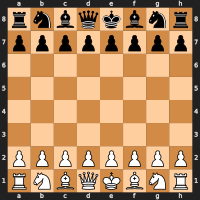

Move 1: You played e2e4


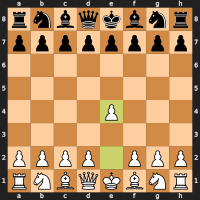

Move 1: AI played f7f5


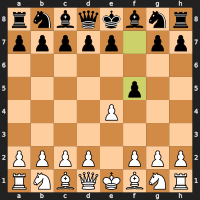

Move 2: You played e4f5


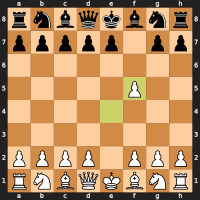

Move 2: AI played h7h5


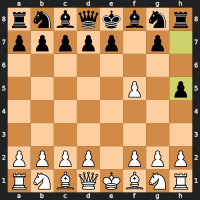

Move 3: You played f1e2


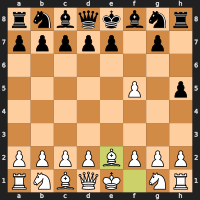

Move 3: AI played h8h6


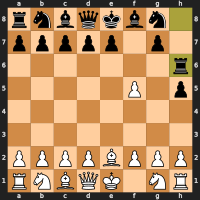

Move 4: You played e2h5


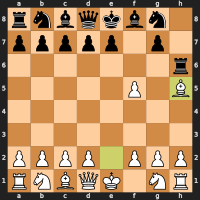

Move 4: AI played h6g6


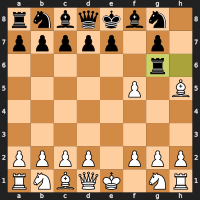

Move 5: You played h5g6


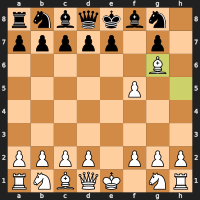

Checkmate! White won.
Number of positions evaluated by the AI:  0


In [35]:
if __name__ == "__main__":
    run_chess_game(ai_opponent_move=ai_opponent_random_move,
                   evaluate_board_function=None, show_num_positions_evaluated=True, print_moves=True, show_board=True)

As we can see, the opponent is very bad and has absolutely no structure or tactics behind the moves.  To improve upon this, we will introduce the minimax algorithm which will allow us to search the game tree of potential moves and find the best move. 

## MiniMax Algorithm

Minimax is adecision-making algorithm that searches the game tree of potential moves and helps players make optimal moves by minimizing the possible loss for a worst-case scenario (hence the name "minimax"). This is done by assuming that the opponent will also play optimally and will try to minimize the possible loss for the player, which, in chess, is a great assumption to make. It is possible to go for more complicated positions where lower level opponents are more likely to blunder but hoping for a blunder is not an efficient strategy for higher level players.

In our case, the minimax algorithm explores potential moves (goes through the legal moves that can be move) and for each of them simulate subsequent responses by both players, simulating the game several moves ahead. By doing this, a game tree of $n$ depth is created with the root node being the current position and the children branching out are the reachable positions like seen in the example below (figure by [SereneBiologist](https://medium.com/@SereneBiologist/the-anatomy-of-a-chess-ai-2087d0d565#:~:text=The%20minimax%20algorithm%20takes%20advantage,other%20tries%20to%20minimize%20it.))

[<img src="https://miro.medium.com/v2/resize:fit:828/format:webp/1*vUbDUMoUILX_qDiMuAmpVg.png" width="400">]()

The algorithm assigns a score to each possible move, based on how favorable the resulting position is, which is a metric that can be calculated in many different ways and with many different functions. Generally, positive scores indicate a better position for the person playing as white, while negative scores indicate a worse position for the person playing as white but better for the black. If you are white, the goal is to maximize your score whilst minimizing the opponent's score, and vice versa if you are black, as demonstrated by the figure below (by [SereneBiologist](https://medium.com/@SereneBiologist/the-anatomy-of-a-chess-ai-2087d0d565#:~:text=The%20minimax%20algorithm%20takes%20advantage,other%20tries%20to%20minimize%20it.)
)

[<img src="https://miro.medium.com/v2/resize:fit:828/format:webp/1*3MQD8VuYDKCSAZOsv7qAsQ.png" width="500">]()

As we can see from the figure above, white (denoted by the darker shade) has two possible moves and chooses the one that gives the higher number (7 against 4), whereas black (denoted by the lighter shade) would choose the one that gives the lowest possible number for the subtree of 7. Since in this case there is only one available move for the black (it does not change the evaluation from 7), black plays it. Now white once again chooses the move that gives it the highest possible score (which is 7 once again meaning that other moves worsen its position).

Looking at the other side of the tree, we see black choosing moves that minimize its score. This process is repeated until the depth limit is reached. 



If there was not a depth limit, given a proper evaluation function, the perfect game would be played out. However, this is not computationally feasible as there exist approximately $10^{43}$ to $10^{50}$ unique chess positions. However, the number of possible sequences to reach these positions is much larger and is deemed as the Shannon number of chess, which is $10^{120}$, which is greater than the number of atoms in the observable universe.

More precisely, the number of possible moves grows exponentially with the depth of the tree. To elucidate, on the first move, there are exactly 20 available moves for white to play. This gives the number of possible moves when depth is equal to 1 to be 20. For each of these moves, the black has 20 responses with making the total number of possible moves to be $20^2=400$ when depth is equal to 2. in the following move, white has more than 20 moves to play for each of the 400 moves (since now knights can go in many different ways, bishops can take any place on the diagonal, etc.) giving the total number of possible moves to be $(20+C)^3=8000+C_2$ when depth is equal to 3. Specifically, the number of possibilities is equal to $8903$. By depth of $5$, the number of possibilities is over $20,000,000$ and continues growing exponentially. 

Generally, with an average branching factor of around 30 (we have, on average, around 30 legal we can make in every move) depth of 6 generated $30^6=729,000,000$ positions. Thus, we have to impose a depth limit. 

#### Defining the evaluation function

Before we can implement the minimax algorithm, we need to define the evaluation function. This function will be used to evaluate the position of the board and assign a score to it. As explained earlier, the higher the score, the better the position for the player who is playing as white. The lower the score (negative score), the better the position for the player who is playing as black. Thus, we create a function that takes in a board and returns a score.

The most fundamental evaluation heuristic one learns in chess is measuring the material on board. The simplest version of this would be to just count the number of pieces on the board. However, not all pieces are worth the same amount. To account for this, we assign a value to each piece and sum them up. The values for each piece are derived from their relative worth compared to the pawn. As such, we generally assign the following values to each piece:

* Pawn: 1
* Knight: 3 (equal to 3 pawns)
* Bishop: 3 (equal to 3 pawns)
* Rook: 5 (equal to 5 pawns)
* Queen: 9 (equal to 9 pawns)

The evaluation function is then defined as the sum of the values of all the pieces on the board. More specifically, we count the white pieces as positive and the black pieces as negative and sum them up to get the final evaluation score. If white has more material, the sum will be positive and if black has more material, the sum will be negative which works perfectly for our minimax algorithm. 

In our case, we will be using the centipawn which is essentially the same as the one described above but with the values multiplied by 100. This is done to make the evaluation function easier to work with as we start adding more heuristics to it. 

In [17]:
def evaluate_board(board):
    """
    Evaluates the board and returns the centipawn score for the current board position. 
    Each piece has a value and the score is the final score is the sum of the values of the pieces on the board.
    The piece value is positive if the piece is white and negative if the piece is black.
    If white is better, the score is positive and if black is better, the score is negative.

    Chess piece values:
        Pawn: 100
        Knight: 300
        Bishop: 300
        Rook: 500
        Queen: 900
    This means that one knight is roughly equal to three pawns, one queen is roughly equal to nine pawns, etc.

    Args:
        board (chess.Board): The board to evaluate.

    Returns:
        int: The score for the current player.
    """

    # if white checkmates, the score is 99999. if black checkmates, the score is -99999.
    if board.is_checkmate():
        return 99999 if not board.turn else -99999

    # if the game is a draw, the score is 0.
    if board.is_stalemate() or board.is_insufficient_material():
        return 0

    piece_values = {
        chess.PAWN: 100,
        chess.KNIGHT: 300,
        chess.BISHOP: 300,
        chess.ROOK: 500,
        chess.QUEEN: 900,
        chess.KING: 0
    }

    score = 0  # the score starts at 0.
    for piece in board.piece_map().values():
        # for each piece on the board, add its value to the total score.
        # if the piece is white, add its value to the  total score. if the piece is black, subtract its value from the total score.
        score += piece_values[piece.piece_type] if piece.color == chess.WHITE else - \
            piece_values[piece.piece_type]
    return score


### Minimax Algorithm Implementation

This code consists of two functions: *ai_opponent_minimax_move()* and the helper *minimax()* function.

* *minimax()*: This is the main recursive implementation of the minimax algorithm. It works essentially like a recursive Depth First Search (DFS) algorithm does but only goes to a certain depth. It takes in the board, the depth, and a boolean value that indicates whether it is the maximizing player's turn or not. If it is the maximizing player's turn, it will return the move that gives the highest score. If it is the minimizing player's turn, it will return the move that gives the lowest score. It finds it by looking at a list of all possible moves and recursively calling itself on each of them until it reaches the depth limit at which point it returns the evaluation score of the board by calling the assigned evaluation function (like the one above). It keeps track of the best evaluation score and the best move that gave it that score based on the minimax principle explained above. 

* *ai_opponent_minimax_move()*: This function is the one that is called by the main game loop. It takes in the board and the depth limit and for each of the legal moves calls the *minimax()* function on it which returns the score of the board after that move. It then chooses the move that gives the highest score and returns it.

In [18]:
def minimax(board, depth, is_maximizing, evaluate_board_function, parent_move=None, position_count=0):
    """
    Uses the minimax algorithm of an arbitrary depth to find the best move for the current player through recursion.

    Args:
        board (chess.Board): The board to evaluate.
        depth (int): The depth of the minimax algorithm.
        is_maximizing (bool): Whether the current player is maximizing or minimizing.
        parent_move (chess.Move): The last move made. 
        position_count (int): The number of positions seen so far.
        evaluation_function (function): The evaluation function to use.

    Returns:
        int: The score for the current player.
    """
    # if the depth is 0 or the game is over, return the evaluation of the board.
    if depth == 0 or board.is_game_over():
        return evaluate_board_function(board), 1

    # if the current player is maximizing, the best evaluation is the lowest possible value.
    # if the current player is minimizing, the best evaluation is the highest possible value.
    best_evaluation = float('-inf') if is_maximizing else float('inf')
    # if the current player is maximizing, the evaluation comparison function is max.
    evaluation_comparison_function = max if is_maximizing else min

    moves_dict = {}
    total_positions_seen = 0

    # for each legal move, evaluate the board after the move by calling the minimax function recursively.
    legal_moves = list(board.legal_moves)
    for move in legal_moves:
        board.push(move)  # push the move to the board.
        # call the minimax function recursively.
        evaluation, positions_seen = minimax(
            board, depth - 1, not is_maximizing, evaluate_board_function, move, position_count)
        total_positions_seen += positions_seen
        board.pop()  # pop the move from the board.
        # update the best evaluation if the current evaluation is better.
        best_evaluation = evaluation_comparison_function(
            best_evaluation, evaluation)
        moves_dict[move] = evaluation


    return best_evaluation, total_positions_seen


def ai_opponent_minimax_move(board, move_count, evaluate_board_function, depth=3, print_moves=True):
    """
    Uses the minimax algorithm to find the best move for the current player. 
    The best move is the move that results in the best evaluation for the current player.

    Args:
        board (chess.Board): The board to evaluate.
        move_count (int): The number of moves that have been played.
        depth (int, optional): The depth of the minimax algorithm. Defaults to 3.
        evaluation_function (function, optional): The evaluation function to use. Defaults to evaluate_board.
        print_moves (bool, optional): Whether to print the best move. Defaults to True.

    Returns:
        chess.Board: The board after the best move is played.
        int: The number of moves that have been played.
        str: The best move.
        int: The from square of the best move.
        int: The to square of the best move.
        int: The number of positions evaluated by the AI.
    """

    # print(f"It is {'white' if board.turn else 'black'} \'s turn to move.")
    best_move = None  # the best move starts as None.
    # the best evaluation starts as the lowest possible value if the current player is maximizing or the highest possible value if the current player is minimizing.
    best_eval = float('-inf') if board.turn else float('inf')
    # the evaluation comparison function is max if the current player is maximizing or min if the current player is minimizing.
    # the evaluation comparison function.
    eval_comp = max if board.turn else min

    legal_moves = list(board.legal_moves)  # get the list of legal moves.
    positions_evaluated_ai_total = 0
    for move in legal_moves:
        board.push(move)  # push the move to the board.
        evaluation, positions_seen = minimax(board=board, depth=depth - 1,
                                             is_maximizing=board.turn, parent_move=move, position_count=positions_evaluated_ai_total, evaluate_board_function=evaluate_board_function)
        positions_evaluated_ai_total += positions_seen
        board.pop()  # pop the move from the board.
        # if the current evaluation is better than the best evaluation update the best evaluation and best move.
        if eval_comp == max:
            if evaluation > best_eval:
                best_eval = evaluation
                best_move = move
        else:
            if evaluation < best_eval:
                best_eval = evaluation
                best_move = move

    board.push(best_move)  # push the best of the legal moves to the board.

    if print_moves:
        print(
            f"Move {move_count}: AI opponent played {best_move}. Evaluation score: {best_eval}")
    return board, move_count, best_move, best_move.from_square, best_move.to_square, positions_evaluated_ai_total


Let's test how well it performs by playing against it. I will choose the depth limit to be 4 (looking 4 moves ahead). This is not ideal since better players sometimes analyze lines that can sometimes be 10 or more moves deep, given enough time. 

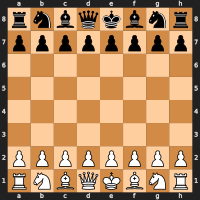

Move 1: You played e2e4


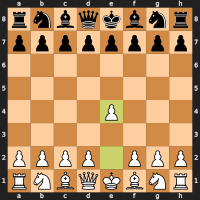

Move 1: AI opponent played g8h6. Evaluation score: 100


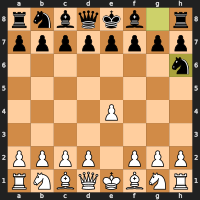

Move 2: You played d2d4


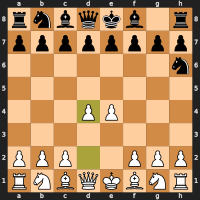

Move 2: AI opponent played e7e6. Evaluation score: 0


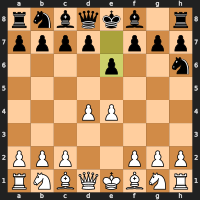

Move 3: You played f2f4


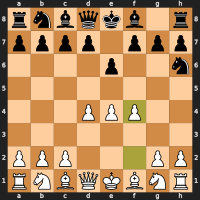

Move 3: AI opponent played h8g8. Evaluation score: 0


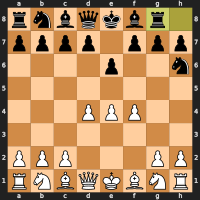

Move 4: You played g1f3


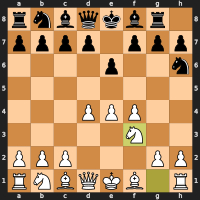

Move 4: AI opponent played g8h8. Evaluation score: 0


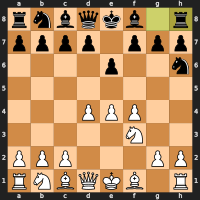

Invalid move: b1b3. Please choose a valid move. You can enter 'available moves' to see the available moves.
Move 5: You played b1c3


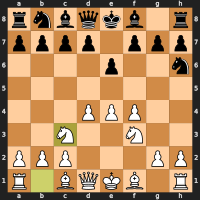

Move 5: AI opponent played f8b4. Evaluation score: 0


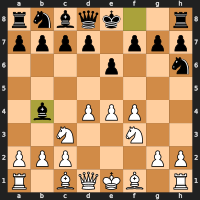

Move 6: You played c1d2


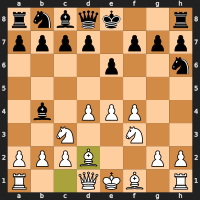

Move 6: AI opponent played h8g8. Evaluation score: 0


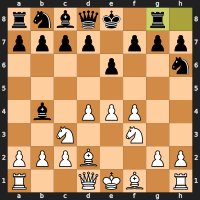

Move 7: You played a2a3


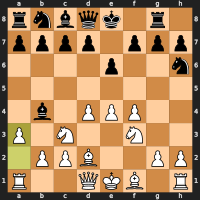

Move 7: AI opponent played b4a5. Evaluation score: 0


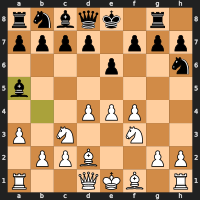

Move 8: You played f1d3


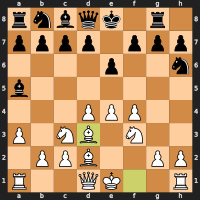

Move 8: AI opponent played g8h8. Evaluation score: 0


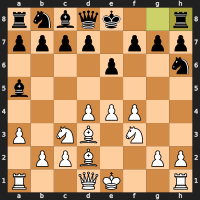

<LegalMoveGenerator at 0x1955ddd5870 (Ng5, Ne5, Nh4, Ng1, Ba6, Bb5, Bc4, Be2, Bf1, Nd5, Nb5, Na4, Ne2, Na2, Nb1, Be3, Bc1, Rg1, Rf1, Kf2, Ke2, Kf1, Qe2, Qc1, Qb1, Ra2, Rc1, Rb1, O-O, f5, e5, d5, a4, h3, g3, b3, h4, g4, b4)>
Move 9: You played e1g1


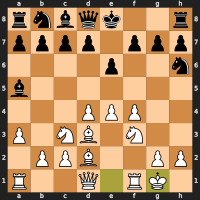

Move 9: AI opponent played h8g8. Evaluation score: 0


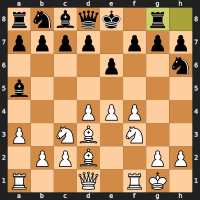

Move 10: You played f3g5


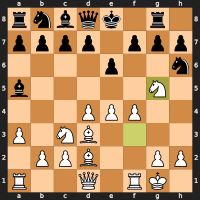

Move 10: AI opponent played g8h8. Evaluation score: 100


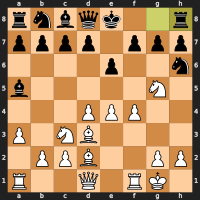

Move 11: You played d1h5


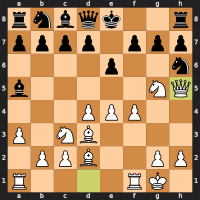

Move 11: AI opponent played h8g8. Evaluation score: 200


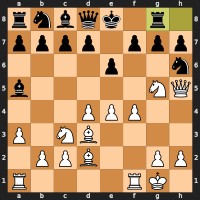

Move 12: You played f4f5


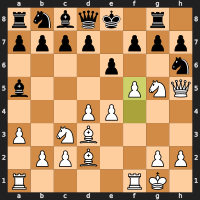

Move 12: AI opponent played e6f5. Evaluation score: 100


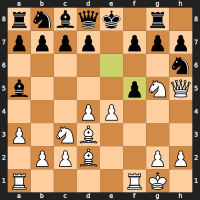

Move 13: You played e4f5


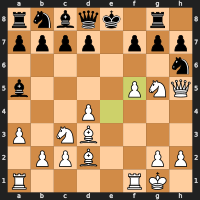

Move 13: AI opponent played g8h8. Evaluation score: 300


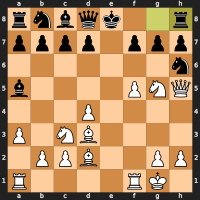

Move 14: You played a1e1


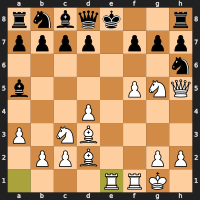

Move 14: AI opponent played e8f8. Evaluation score: 200


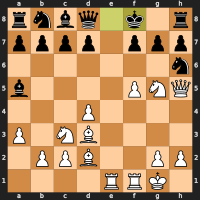

Move 15: You played d3c4


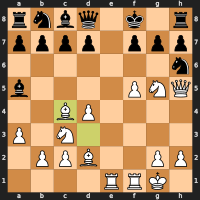

Move 15: AI opponent played d8f6. Evaluation score: 100


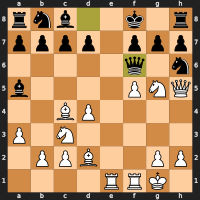

Move 16: You played c3e4


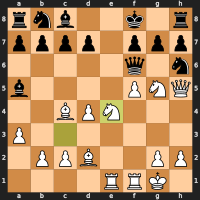

Move 16: AI opponent played f6d4. Evaluation score: -100


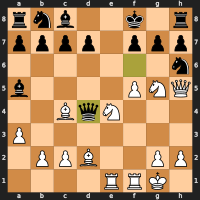

Invalid move: c4f7. Please choose a valid move. You can enter 'available moves' to see the available moves.
Last move undone. Current state of the board:


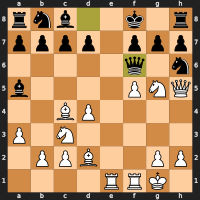

Invalid move: f5e6. Please choose a valid move. You can enter 'available moves' to see the available moves.
Move 16: You played g5e6


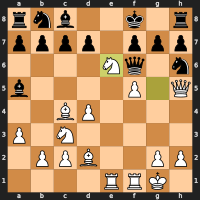

Move 16: AI opponent played d7e6. Evaluation score: -200


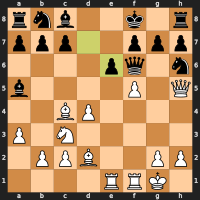

Move 17: You played f5e6


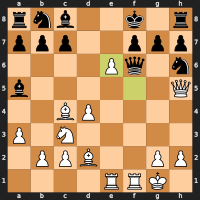

Move 17: AI opponent played f6d4. Evaluation score: -300


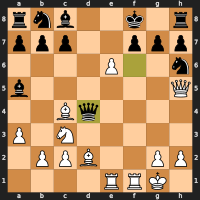

Move 18: You played d2e3


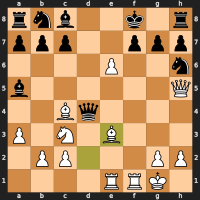

Move 18: AI opponent played d4c4. Evaluation score: -200


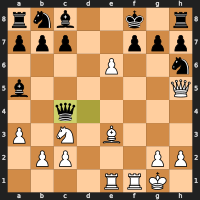

Move 19: You played f1f7


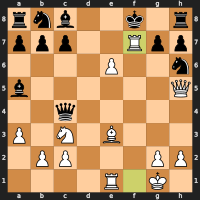

Move 19: AI opponent played f8g8. Evaluation score: -100


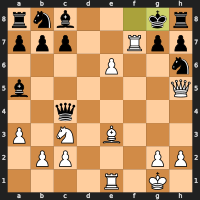

Move 20: You played f7g7


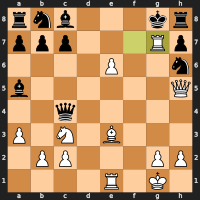

Move 20: AI opponent played g8f8. Evaluation score: 200


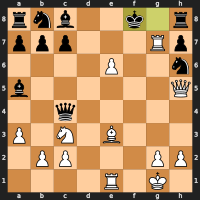

Move 21: You played e6e7


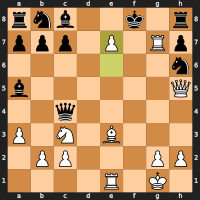

Move 21: AI opponent played f8g7. Evaluation score: 200


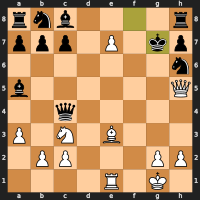

Move 22: You played e3h6


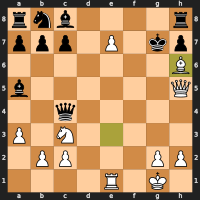

Move 22: AI opponent played g7f6. Evaluation score: 200


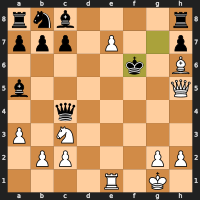

Move 23: You played h5g5


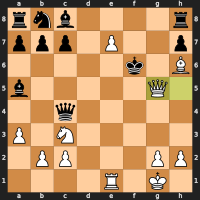

Move 23: AI opponent played f6f7. Evaluation score: 99999


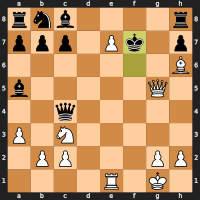

Move 24: You played g5g7


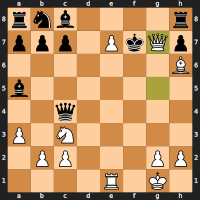

Move 24: AI opponent played f7e8. Evaluation score: 700


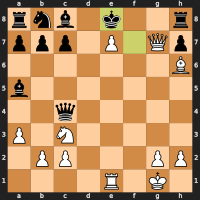

Move 25: You played g7h8


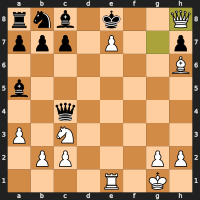

Move 25: AI opponent played c4g8. Evaluation score: 1600


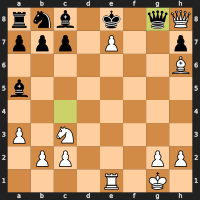

Move 26: You played h8g8


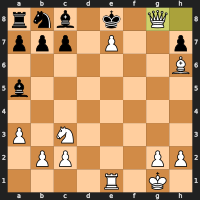

Move 26: AI opponent played e8d7. Evaluation score: 99999


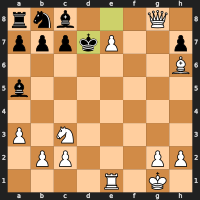

Invalid move: e8. Please choose a valid move. You can enter 'available moves' to see the available moves.
Invalid move: e7e8. Please choose a valid move. You can enter 'available moves' to see the available moves.
Invalid move: e7-Q. Please choose a valid move. You can enter 'available moves' to see the available moves.
<LegalMoveGenerator at 0x1955df3bfd0 (Qh8, Qf8, Qe8+, Qd8+, Qxc8+, Qxh7, Qg7, Qf7, Qg6, Qe6+, Qg5, Qd5+, Qg4+, Qc4, Qg3, Qb3, Qa2, Bf8, Bg7, Bg5, Bf4, Be3, Bd2, Bc1, Nd5, Nb5, Ne4, Na4, Ne2, Na2, Nd1, Nb1, Kf2, Kh1, Kf1, Re6, Re5, Re4, Re3, Re2, Rf1, Rd1+, Rc1, Rb1, Ra1, e8=Q+, e8=R, e8=B+, e8=N, a4, h3, g3, b3, h4, g4, b4)>
Move 27: You played e7e8q


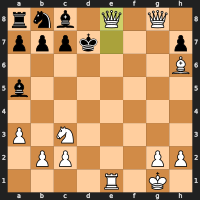

Move 27: AI opponent played d7d6. Evaluation score: 99999


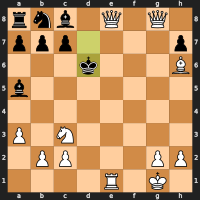

Move 28: You played g8d5


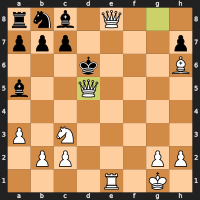

Checkmate! White won.
Number of positions evaluated by the AI:  29310595


In [37]:
if __name__ == "__main__":
    run_chess_game(ai_opponent_move=ai_opponent_minimax_move,
                   evaluate_board_function=evaluate_board,
                   depth=4,
                   show_num_positions_evaluated=True,
                   print_moves=True,
                   show_board=True)

As we can see, the results are quite amazing and the AI was able to survive quite well for almost 30 moves just by looking 4 moves deep and choosing the one that minimizes its loss the most. However, it had some crucial flaws: we see it got stuck into loops sometimes (e.g. it kept moving the rook from one square to another and moving it back on move 3 and couple of other times). This makes perfect sense from its perspective as there is no way to gain material so it is doing a move that is maintaining the status quo. However, that also means that AI has completely wasted 2 moves, which gave me a huge advantage and allowed me to develop my pieces giving me a huge advantage. 

One way to prevent this from happening would be to add a heuristic that penalizes the AI for repeating the same move. This might be easily fixable but there is one crucial flaw in the algorithm:  The model has the tactical ability but completely lacks the positional awareness of the game due to its evaluation function being completely materialistic.
As you can see on Move 7, the evaluation score is 0 (based on the material that is true) but I am substantially better off as I have a very strong center and I have developed more of my pieces which are in strong positions and control more of the board. I can easily take advantage of the AI's flaw by just developing my position (without attacking) until I eventually completely overwhelm the AI and win easily.

Also, the AI was immensely slow as it looked at nearly 30,000,000 different positions so speed is another issue that needs to be addressed.

To better see this lack of positional awareness, lets have the AI play against itself. I will set the depth limit to 3 and let it play for 10 moves. 

In [42]:
def ai_opponents_against_one_another(ai_opponent_move, evaluate_board_function, initial_board = None, rounds = 8, depth = 3):
    board = chess.Board()
    if initial_board:
        board.set_fen(initial_board)

    display(chess.svg.board(board=board, size=200))
    move_count = 1
    total_positions_analyzed_white = 0
    total_positions_analyzed_black = 0

    for _ in range(rounds):
        board, move_count, best_move, from_square, to_square, positions_evaluated_white = ai_opponent_move(board=board, move_count=move_count, depth=depth, print_moves=True, evaluate_board_function=evaluate_board_function)
        display(chess.svg.board(board=board, size=200,
                lastmove=chess.Move(from_square, to_square)))
        board, move_count, best_move, from_square, to_square, positions_evaluated_black = ai_opponent_move(board=board, move_count=move_count, depth=depth, print_moves=True, evaluate_board_function=evaluate_board_function)
        display(chess.svg.board(board=board, size=200,
                lastmove=chess.Move(from_square, to_square)))
        move_count += 1
        total_positions_analyzed_white += positions_evaluated_white
        total_positions_analyzed_black += positions_evaluated_black

    print(f"Total positions analyzed by white: {total_positions_analyzed_white}")
    print(f"Total positions analyzed by black: {total_positions_analyzed_black}")


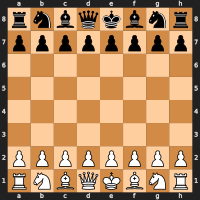

Move 1: AI opponent played g1h3. Evaluation score: 0


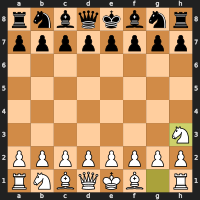

Move 1: AI opponent played g8h6. Evaluation score: 0


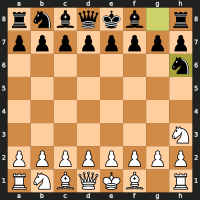

Move 2: AI opponent played h3g5. Evaluation score: 100


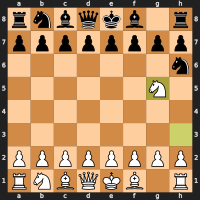

Move 2: AI opponent played h6g4. Evaluation score: -100


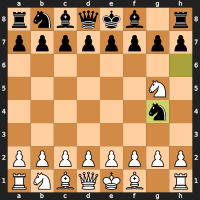

Move 3: AI opponent played b1c3. Evaluation score: 100


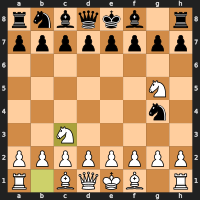

Move 3: AI opponent played b8c6. Evaluation score: -100


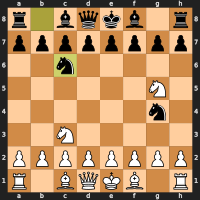

Move 4: AI opponent played c3d5. Evaluation score: 100


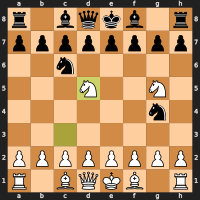

Move 4: AI opponent played e7e6. Evaluation score: -200


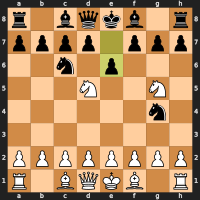

Move 5: AI opponent played d5e3. Evaluation score: 0


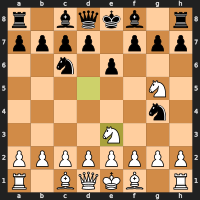

Move 5: AI opponent played d8g5. Evaluation score: -300


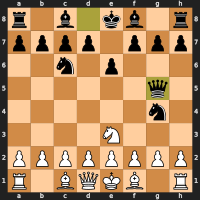

Move 6: AI opponent played h2h4. Evaluation score: 0


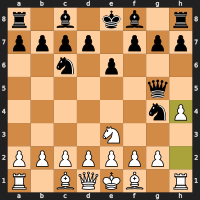

Move 6: AI opponent played g4e3. Evaluation score: -400


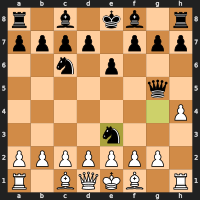

Move 7: AI opponent played h4g5. Evaluation score: -300


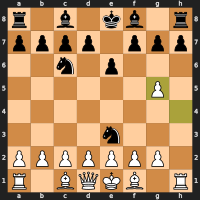

Move 7: AI opponent played e3d1. Evaluation score: -300


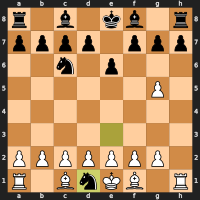

Move 8: AI opponent played e1d1. Evaluation score: -200


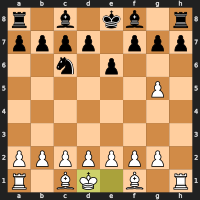

Move 8: AI opponent played f8e7. Evaluation score: -400


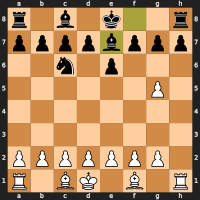

Move 9: AI opponent played h1h5. Evaluation score: -200


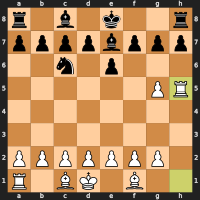

Move 9: AI opponent played e8f8. Evaluation score: -400


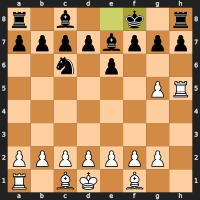

Move 10: AI opponent played d1e1. Evaluation score: -200


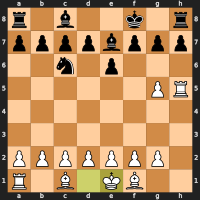

Move 10: AI opponent played f8g8. Evaluation score: -400


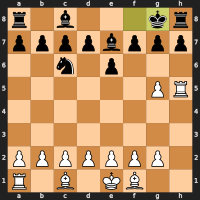

Total positions analyzed by white: 173258
Total positions analyzed by black: 215595


In [40]:
if __name__ == "__main__":
    ai_opponents_against_one_another(ai_opponent_move=ai_opponent_minimax_move, evaluate_board_function=evaluate_board, rounds=10, depth=3)

As we can see, two AI bots playing with this style really showcases the flaws in the approach. Only beginner players would play like this. To improve upon this, we have to add some positional awareness to our evaluation function.


Now, positional awareness is a very complex topic but something fundamental for a good chess player to have. As a matter of fact, I am fairly confident that that is a natural progression for players from 1400s to above 1650s. As players start to make less and less tactical blunders, it is positional awareness that starts to become more and more important and becomes what separates the good players from the great ones.

Thus, we will improve our evaluation function to take into account some of the most important positional factors 

### Improved evaluation function: adding positional awarenes

To implement positional awareness, I will use the piece-square table adoped from the [Chess programming wiki](https://www.chessprogramming.org/Simplified_Evaluation_Function). These tables assign a value to each square on the board for each type of piece representing how good or bad it is for that piece to occupy the square. The values, much like I nudged at above, are determined based on the piece's mobility, control of central squares, and other positional factors. This is an example of a piece-square table for the figures (taken from [here](https://www.freecodecamp.org/news/simple-chess-ai-step-by-step-1d55a9266977/)) although the values are not in centipawns but in pawns.

[<img src="https://cdn-media-1.freecodecamp.org/images/1*iG6FUYZpU0_RKlqHnC8XxA.png" width="500">]()

**Knight**:
The knight values emphasize the importance of central squares and the relative weakness of the knight on the edges and corners of the board. The values decrease as the knight moves away from the center, with the lowest values (-50) in the corners. This is consistent with the principle that knights are more effective in the center of the board, where they can control more squares and be more active.

**Bishop**:
The bishop values encourage the bishops to occupy long diagonals and central squares. The values are higher in the center and gradually decrease towards the edges. The lowest values are in the corners and edges (-20 and -10), where the bishops have limited mobility and control fewer squares. This reflects the principle that bishops are most effective when they have long open diagonals and can control important central squares.

**Rook**:
The rook values encourage rooks to be placed on open or semi-open files, especially in the middle of the board. The values are higher in the second rank (5 and 10), reflecting the potential for rooks to be active and pressure the opponent's position. The negative values (-5) on other ranks are designed to discourage passive placement of rooks.

**Queen**:
The queen values encourage centralization and activity. The values are highest (5) in the central squares and decrease towards the edges. The lowest values are in the corners (-20) and the edge squares (-10), where the queen's mobility is limited. This reflects the principle that the queen is most effective when it can control many squares and participate in various threats across the board.

**King**:
The king values exhibit the principle of king safety. The values are higher in the back ranks and towards the corners, as the king is generally safer when it is away from the center and closer to the edges. The higher values (20, 30, and 10) in the seventh and eighth ranks indicate the preference for castling and keeping the king protected behind a pawn shield.

**Pawn**:
The pawn values encourage pawn advancement and control of central squares. The values are highest (50) on the fifth rank, reflecting the importance of advancing pawns towards promotion. The values on the third and fourth ranks (20 and 30) encourage central pawn presence, while the negative values (-10 and -20) on the sixth and seventh ranks discourage pawn weaknesses and backward pawns.

In [44]:
def get_value_from_square(square, A):
    """
    Gets the value from the piece square table for the given square. Helper function.

    Args:
        square (int): The square to get the value from.
        A (list): The piece square table.

    Returns:
        int: The value from the piece square table for the given square.
    """

    row = 7 - (square // 8)
    col = square % 8
    return A[row][col]


def evaluate_board_improved(board):
    """
    Evaluates the board and returns the centipawn score for the current board position. 
    Each piece has a value and the score is the final score is the sum of the values of the pieces on the board.
    The piece value is positive if the piece is white and negative if the piece is black.
    If white is better, the score is positive and if black is better, the score is negative.

    Chess piece values:
        Pawn: 100
        Knight: 300
        Bishop: 300
        Rook: 500
        Queen: 900

    This means that one knight is roughly equal to three pawns, one queen is roughly equal to nine pawns, etc.

    It also uses piece square tables to evaluate the position of the pieces on the board giving the AI a better position understanding. 
    The values are added to the piece values to get the final score.

    Args:
        board (chess.Board): The board to evaluate.

    Returns:
        int: The score for the current player.
    """

    if board.is_checkmate():
        return 99999 if not board.turn else -99999

    if board.is_stalemate() or board.is_insufficient_material():
        return 0

    piece_square_tables_for_white = {chess.KNIGHT: [[-50, -40, -30, -30, -30, -30, -40, -50],
                                                    [-40, -20,  0,  0,
                                                     0,  0, -20, -40],
                                                    [-30,  0, 10, 15,
                                                     15, 10,  0, -30],
                                                    [-30,  5, 15, 20,
                                                     20, 15,  5, -30],
                                                    [-30,  0, 15, 20,
                                                     20, 15,  0, -30],
                                                    [-30,  5, 10, 15,
                                                     15, 10,  5, -30],
                                                    [-40, -20,  0,  5,
                                                     5,  0, -20, -40],
                                                    [-50, -40, -30, -30, -30, -30, -40, -50]],
                                     chess.BISHOP: [[-20, -10, -10, -10, -10, -10, -10, -20],
                                                    [-10,  0,  0,  0,
                                                     0,  0,  0, -10],
                                                    [-10,  0,  5, 10,
                                                     10,  5,  0, -10],
                                                    [-10,  5,  5, 10,
                                                     10,  5,  5, -10],
                                                    [-10,  0, 10, 10,
                                                     10, 10,  0, -10],
                                                    [-10, 10, 10, 10,
                                                     10, 10, 10, -10],
                                                    [-10,  5,  0,  0,
                                                     0,  0,  5, -10],
                                                    [-20, -10, -10, -10, -10, -10, -10, -20]],
                                     chess.ROOK: [[0, 0, 0, 0, 0, 0, 0, 0],
                                                  [5, 10, 10, 10, 10, 10, 10, 5],
                                                  [-5, 0, 0, 0, 0, 0, 0, -5],
                                                  [-5, 0, 0, 0, 0, 0, 0, -5],
                                                  [-5, 0, 0, 0, 0, 0, 0, -5],
                                                  [-5, 0, 0, 0, 0, 0, 0, -5],
                                                  [-5, 0, 0, 0, 0, 0, 0, -5],
                                                  [0, 0, 0, 5, 5, 0, 0, 0]],
                                     chess.QUEEN: [[-20, -10, -10, -5, -5, -10, -10, -20],
                                                   [-10,  0,  0,  0,
                                                    0,  0,  0, -10],
                                                   [-10,  0,  5,  5,
                                                    5,  5,  0, -10],
                                                   [-5,  0,  5,  5, 5,  5,  0, -5],
                                                   [0,  0,  5,  5, 5,  5,  0, -5],
                                                   [-10,  5,  5,  5,
                                                    5,  5,  0, -10],
                                                   [-10,  0,  5,  0,
                                                    0,  0,  0, -10],
                                                   [-20, -10, -10, -5, -5, -10, -10, -20]],
                                     chess.KING: [[-30, -40, -40, -50, -50, -40, -40, -30],
                                                  [-30, -40, -40, -50, -
                                                   50, -40, -40, -30],
                                                  [-30, -40, -40, -50, -
                                                   50, -40, -40, -30],
                                                  [-30, -40, -40, -50, -
                                                   50, -40, -40, -30],
                                                  [-20, -30, -30, -40, -
                                                   40, -30, -30, -20],
                                                  [-10, -20, -20, -20, -
                                                   20, -20, -20, -10],
                                                  [20, 20, 0, 0, 0, 0, 20, 20],
                                                  [20, 30, 10, 0, 0, 10, 30, 20]],
                                     chess.PAWN: [[0, 0, 0, 0, 0, 0, 0, 0],
                                                  [50, 50, 50, 50, 50, 50, 50, 50],
                                                  [10, 10, 20, 30, 30, 20, 10, 10],
                                                  [5, 5, 10, 25, 25, 10, 5, 5],
                                                  [0, 0, 0, 20, 20, 0, 0, 0],
                                                  [5, -5, -10, 0, 0, -10, -5, 5],
                                                  [5, 10, 10, -20, -20, 10, 10, 5],
                                                  [0, 0, 0, 0, 0, 0, 0, 0]]}
    piece_square_tables_for_black = {
        chess.KNIGHT: [[-50, -40, -30, -30, -30, -30, -40, -50],
                       [-40, -20, 0, 5, 5, 0, -20, -40],
                       [-30, 5, 10, 15, 15, 10, 5, -30],
                       [-30, 0, 15, 20, 20, 15, 0, -30],
                       [-30, 5, 15, 20, 20, 15, 5, -30],
                       [-30, 0, 10, 15, 15, 10, 0, -30],
                       [-40, -20, 0, 0, 0, 0, -20, -40],
                       [-50, -40, -30, -30, -30, -30, -40, -50]],
        chess.BISHOP: [[-20, -10, -10, -10, -10, -10, -10, -20], [-10, 5, 0, 0, 0, 0, 5, -10], [-10, 10, 10, 10, 10, 10, 10, -10], [-10, 0, 10, 10, 10, 10, 0, -10], [-10, 5, 5, 10, 10, 5, 5, -10], [-10, 0, 5, 10, 10, 5, 0, -10], [-10, 0, 0, 0, 0, 0, 0, -10], [-20, -10, -10, -10, -10, -10, -10, -20]],
        chess.ROOK: [[0, 0, 0, 5, 5, 0, 0, 0], [-5, 0, 0, 0, 0, 0, 0, -5], [-5, 0, 0, 0, 0, 0, 0, -5], [-5, 0, 0, 0, 0, 0, 0, -5], [-5, 0, 0, 0, 0, 0, 0, -5], [-5, 0, 0, 0, 0, 0, 0, -5], [5, 10, 10, 10, 10, 10, 10, 5], [0, 0, 0, 0, 0, 0, 0, 0]],
        chess.QUEEN: [[-20, -10, -10, -5, -5, -10, -10, -20], [-10, 0, 5, 0, 0, 0, 0, -10], [-10, 5, 5, 5, 5, 5, 0, -10], [0, 0, 5, 5, 5, 5, 0, -5], [-5, 0, 5, 5, 5, 5, 0, -5], [-10, 0, 5, 5, 5, 5, 0, -10], [-10, 0, 0, 0, 0, 0, 0, -10], [-20, -10, -10, -5, -5, -10, -10, -20]],
        chess.KING: [[20, 30, 10, 0, 0, 10, 30, 20], [20, 20, 0, 0, 0, 0, 20, 20], [-10, -20, -20, -20, -20, -20, -20, -10], [-20, -30, -30, -40, -40, -30, -30, -20], [-30, -40, -40, -50, -50, -40, -40, -30], [-30, -40, -40, -50, -50, -40, -40, -30], [-30, -40, -40, -50, -50, -40, -40, -30], [-30, -40, -40, -50, -50, -40, -40, -30]],
        chess.PAWN: [[0, 0, 0, 0, 0, 0, 0, 0], [5, 10, 10, -20, -20, 10, 10, 5], [5, -5, -10, 0, 0, -10, -5, 5], [0, 0, 0, 20, 20, 0, 0, 0], [5, 5, 10, 25, 25, 10, 5, 5], [10, 10, 20, 30, 30, 20, 10, 10], [50, 50, 50, 50, 50, 50, 50, 50], [0, 0, 0, 0, 0, 0, 0, 0]]}

    piece_values = {
        chess.PAWN: 100,
        chess.KNIGHT: 300,
        chess.BISHOP: 300,
        chess.ROOK: 500,
        chess.QUEEN: 900,
        chess.KING: 0
    }

    score = 0
    for square in chess.SQUARES:  # iterate over all squares
        piece = board.piece_at(square)  # get the piece on the square
        if piece is not None:  # if there is a piece on the square
            if piece.color == chess.WHITE:  # if the piece is white
                # add the value of the piece to the score
                score += piece_values[piece.piece_type]
                # add the piece-square table value of the piece to the score
                score += get_value_from_square(square,
                                               piece_square_tables_for_white[piece.piece_type])
            else:  # if the piece is black
                # subtract the value of the piece from the score
                score -= piece_values[piece.piece_type]
                # subtract the piece-square table value of the piece from the scor
                score -= get_value_from_square(square,
                                               piece_square_tables_for_black[piece.piece_type])

    return score

Now, we can let the bot play against itself to evaluate how well it is playing compared to the previous version. 

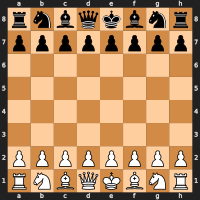

Move 1: AI opponent played g1f3. Evaluation score: 0


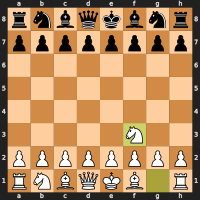

Move 1: AI opponent played g8f6. Evaluation score: 50


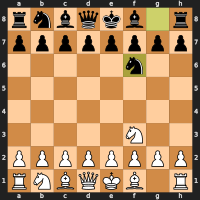

Move 2: AI opponent played b1c3. Evaluation score: 0


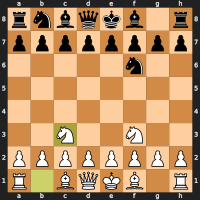

Move 2: AI opponent played b8c6. Evaluation score: 40


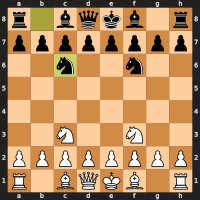

Move 3: AI opponent played e2e3. Evaluation score: -20


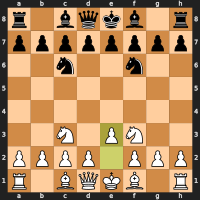

Move 3: AI opponent played e7e6. Evaluation score: 40


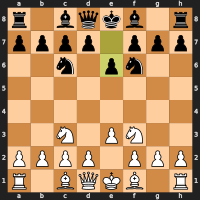

Move 4: AI opponent played f1c4. Evaluation score: -20


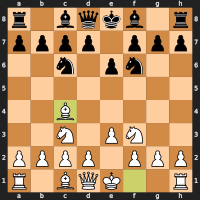

Move 4: AI opponent played f8d6. Evaluation score: 100


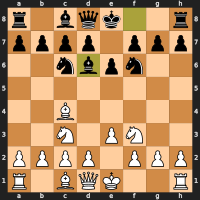

Move 5: AI opponent played h2h3. Evaluation score: -30


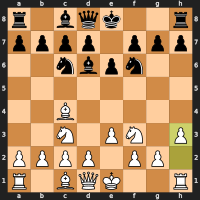

Move 5: AI opponent played e8g8. Evaluation score: 70


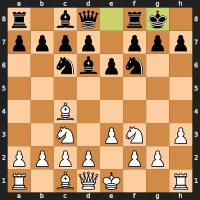

Move 6: AI opponent played e1g1. Evaluation score: -20


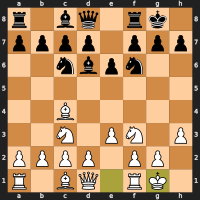

Move 6: AI opponent played f8e8. Evaluation score: 95


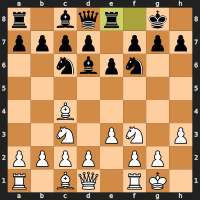

Move 7: AI opponent played d2d3. Evaluation score: -5


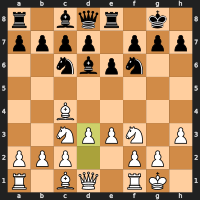

Move 7: AI opponent played d8e7. Evaluation score: 110


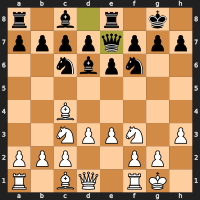

Move 8: AI opponent played c1d2. Evaluation score: 0


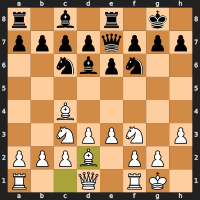

Move 8: AI opponent played e8d8. Evaluation score: 120


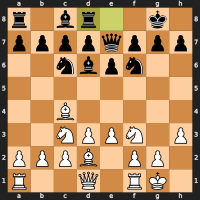

Move 9: AI opponent played f1e1. Evaluation score: 5


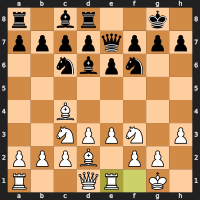

Move 9: AI opponent played d8e8. Evaluation score: 125


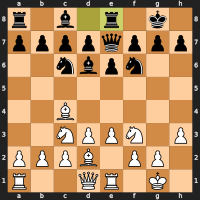

Move 10: AI opponent played d1e2. Evaluation score: 10


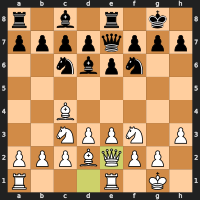

Move 10: AI opponent played e8d8. Evaluation score: 130


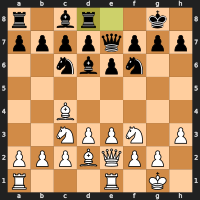

Total positions analyzed by white: 9576
Total positions analyzed by black: 9895


In [45]:
if __name__ == "__main__":
    ai_opponents_against_one_another(ai_opponent_move=ai_opponent_minimax_move, evaluate_board_function=evaluate_board_improved, rounds=10, depth=2)

As we can see, even with the depth of 2 and significantly less nodes visited, the AI is playing much, much better chess. Let's test it by playing a game against it. For time purpose, I will set the depth limit to 3 as 4 takes way too long per move.

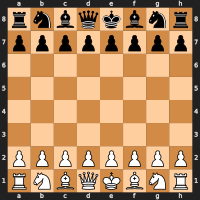

Move 1: You played d2d4


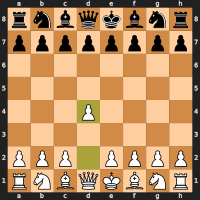

Move 1: AI opponent played b8c6. Evaluation score: -55


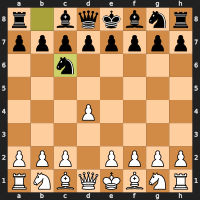

Move 2: You played d4d5


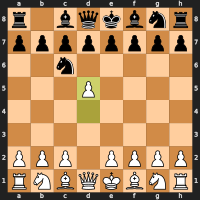

Move 2: AI opponent played c6b4. Evaluation score: -90


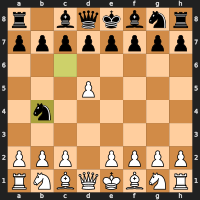

Move 3: You played a2a3


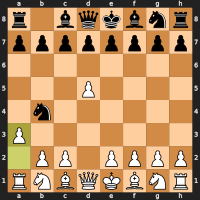

Move 3: AI opponent played b4a6. Evaluation score: 35


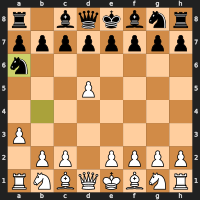

Move 4: You played e2e4


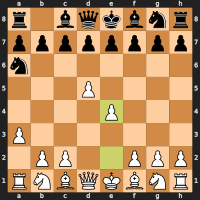

Move 4: AI opponent played a6c5. Evaluation score: -15


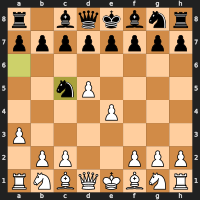

Move 5: You played b1c3


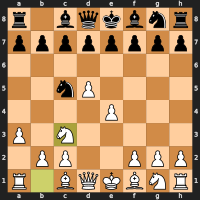

Move 5: AI opponent played g8f6. Evaluation score: -55


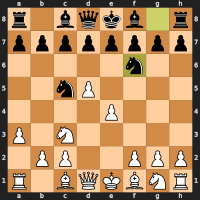

Move 6: You played d1d4


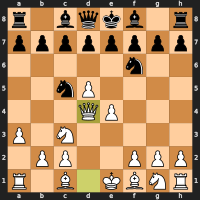

Move 6: AI opponent played f6e4. Evaluation score: -85


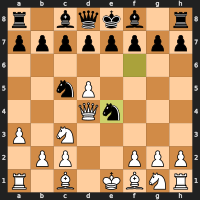

Move 7: You played c3e4


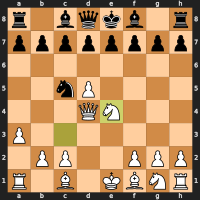

Move 7: AI opponent played c5e4. Evaluation score: 195


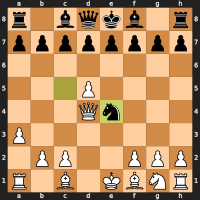

Move 8: You played d4e4


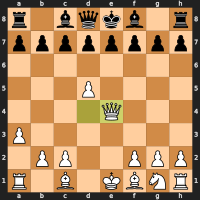

Move 8: AI opponent played e7e6. Evaluation score: 190


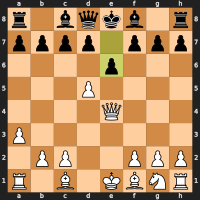

Move 9: You played f1c4


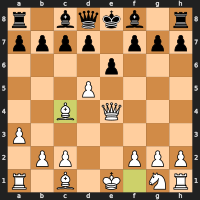

Move 9: AI opponent played f7f5. Evaluation score: 140


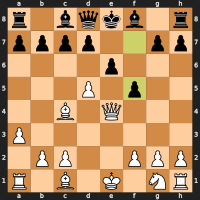

Invalid move: d4d5. Please choose a valid move. You can enter 'available moves' to see the available moves.
Move 10: You played e4e5


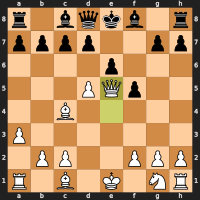

Move 10: AI opponent played d8h4. Evaluation score: 130


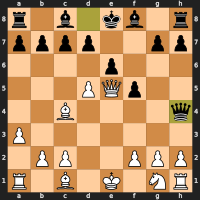

Invalid move: c4c3. Please choose a valid move. You can enter 'available moves' to see the available moves.
Move 11: You played c4b3


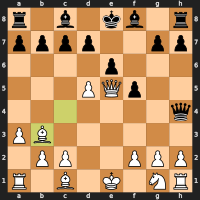

Move 11: AI opponent played d7d6. Evaluation score: 110


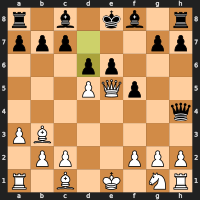

Move 12: You played e5e2


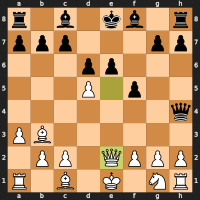

Move 12: AI opponent played e8d8. Evaluation score: 175


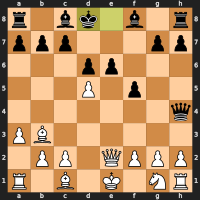

Move 13: You played g1h3


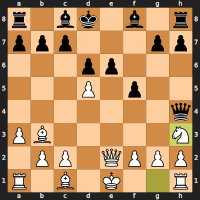

Move 13: AI opponent played e6d5. Evaluation score: -40


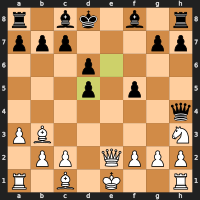

Invalid move: c1c5. Please choose a valid move. You can enter 'available moves' to see the available moves.
Move 14: You played c1g5


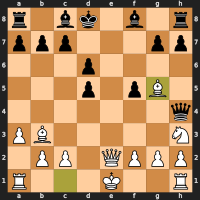

Move 14: AI opponent played h4g5. Evaluation score: 705


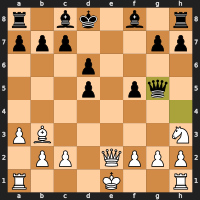

Move 15: You played h3g5


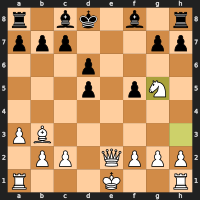

Move 15: AI opponent played f8e7. Evaluation score: 710


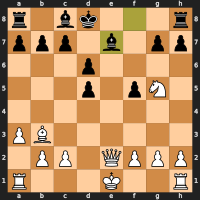

Move 16: You played g5f7


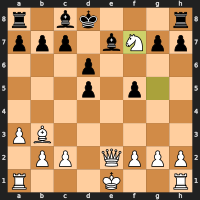

Move 16: AI opponent played d8e8. Evaluation score: 1140


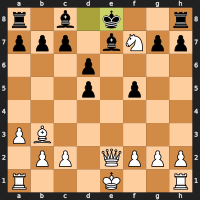

Move 17: You played f7h8


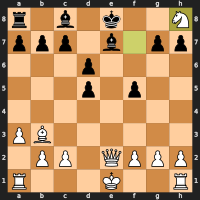

Move 17: AI opponent played d5d4. Evaluation score: 1185


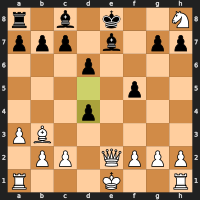

Invalid move: d2h5. Please choose a valid move. You can enter 'available moves' to see the available moves.
Move 18: You played e2h5


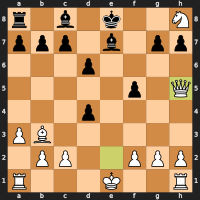

Move 18: AI opponent played e8d8. Evaluation score: 1230


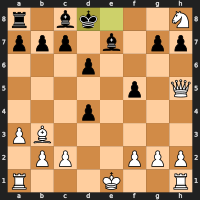

Move 19: You played h5h7


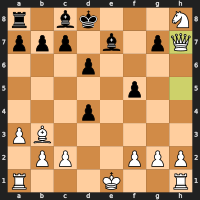

Move 19: AI opponent played d6d5. Evaluation score: 1280


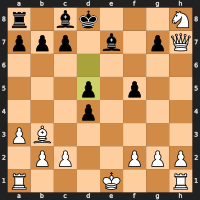

Move 20: You played h7g8


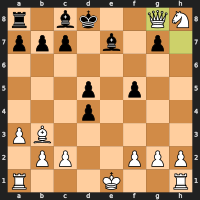

Move 20: AI opponent played d8d7. Evaluation score: 1355


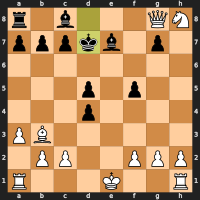

Move 21: You played g8d5


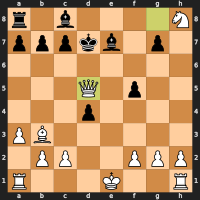

Move 21: AI opponent played d7e8. Evaluation score: 1395


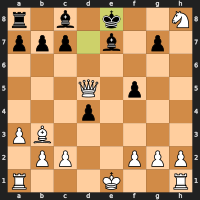

Move 22: You played d5f7


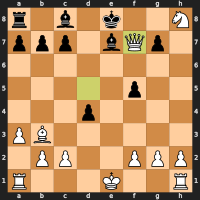

Move 22: AI opponent played e8d8. Evaluation score: 1375


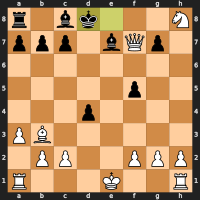

Move 23: You played h8g6


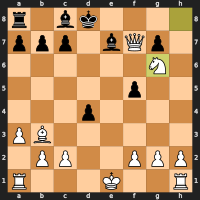

Move 23: AI opponent played e7f6. Evaluation score: 1410


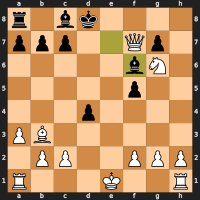

Move 24: You played e1c1


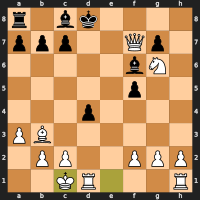

Move 24: AI opponent played c8d7. Evaluation score: 1415


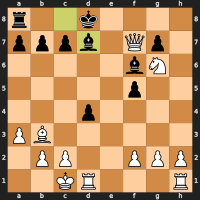

Move 25: You played d1d4


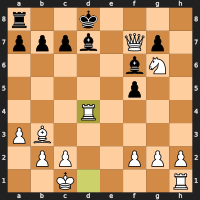

Move 25: AI opponent played f6d4. Evaluation score: 1025


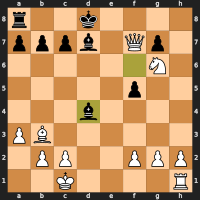

Last move undone. Current state of the board:


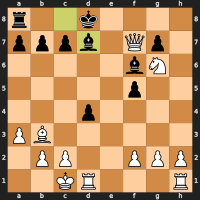

Move 25: You played h1e1


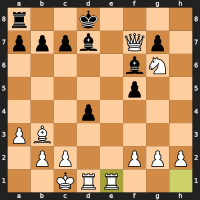

Move 25: AI opponent played d7c6. Evaluation score: 1390


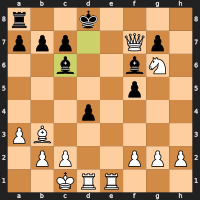

Move 26: You played f7g8


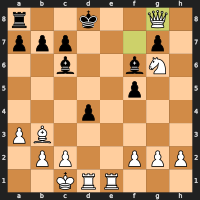

Move 26: AI opponent played d8d7. Evaluation score: 1780


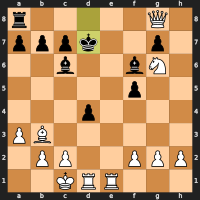

Move 27: You played e1e7


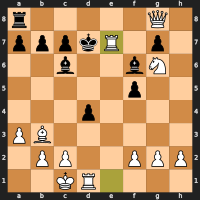

Move 27: AI opponent played f6e7. Evaluation score: 1285


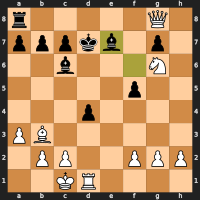

Move 28: You played d1d4


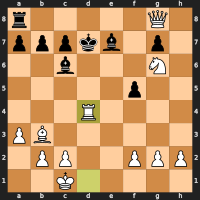

Move 28: AI opponent played c6d5. Evaluation score: 1410


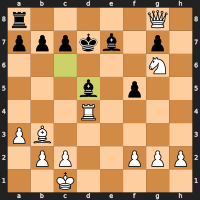

Move 29: You played d4d5


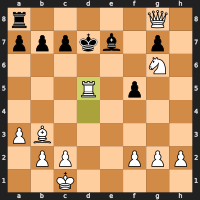

Move 29: AI opponent played d7c6. Evaluation score: 1740


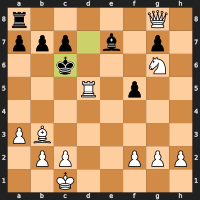

Move 30: You played g6e7


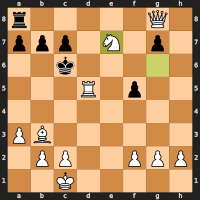

Move 30: AI opponent played c6b6. Evaluation score: 2125


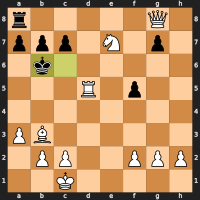

Move 31: You played g8a8


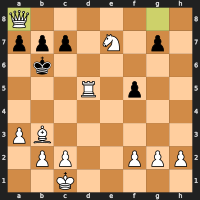

Move 31: AI opponent played f5f4. Evaluation score: 2135


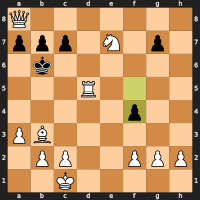

Move 32: You played e7c8


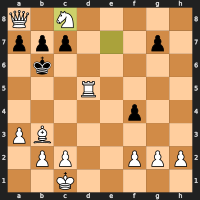

Move 32: AI opponent played b6c6. Evaluation score: 2200


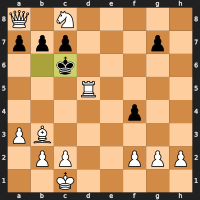

Move 33: You played a8a7


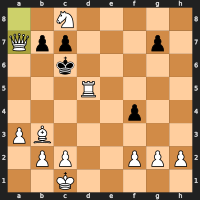

Move 33: AI opponent played g7g6. Evaluation score: 99999


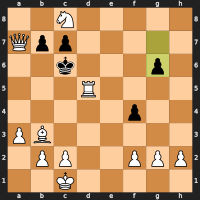

Move 34: You played a7a4


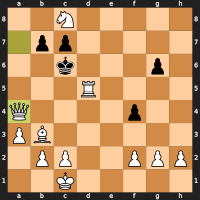

Move 34: AI opponent played b7b5. Evaluation score: 99999


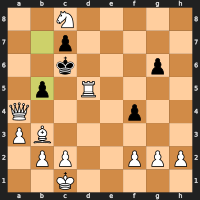

Move 35: You played a4b5


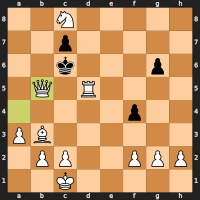

Checkmate! White won.
Number of positions evaluated by the AI:  447768


In [47]:
if __name__ == "__main__":
    run_chess_game(ai_opponent_move=ai_opponent_minimax_move,
                   evaluate_board_function=evaluate_board_improved,
                   depth=3,
                   show_num_positions_evaluated=True,
                   print_moves=True,
                   show_board=True)

The AI obviously lost due to some great blunders it made (greatest of which was in move 6 where it traded a night for a pawn). This is because of the depth limit so it could not look than 3 moves ahead (3 plays not 3 moves since 3 moves is 6 plays). Despite lasting 35 moves, it appears it actually played much worse than the older version with the non-improved evaluation function as I was able to easily beat it with playing a bullet game and not spending more than 4 seconds per move. 

However, the positional awareness improved tremendously. However, now it is laking the tactical power (calculating longer lines). If I gave it the same depth of 4 as the previous version, it would undoubtedly play much better chess than the older version due to combining both positional awareness and tactical ability. However, depth of 4 takes very long to calculate. As such, our next goal is to improve the speed of the AI so we can increase the depth limit.

#### Evaluating the number of positions evaluated for the first move of the game for different depths for each player

Firstly, lets look at the number of positions evaluated for the first move of the game for different depths for each player. In midgame (midgame is when we have deviated from standard opening theory and are now in a game that has never been played before and we have exchanged some pieces) the number of positions evaluated will be higher than in the first move since the branching factor is higher by 10 on average (which is 50%).

Depth = 1

In [21]:
if __name__ == "__main__":
    run_chess_game(ai_opponent_move=ai_opponent_minimax_move,
                   evaluate_board_function=evaluate_board_improved,
                   depth=1,
                   show_num_positions_evaluated=True,
                   print_moves=False,
                   show_board=False)

Number of positions evaluated by the AI:  20
Exiting the game.


Depth = 2

In [22]:
if __name__ == "__main__":
    run_chess_game(ai_opponent_move=ai_opponent_minimax_move,
                   evaluate_board_function=evaluate_board_improved,
                   depth=2,
                   show_num_positions_evaluated=True,
                   print_moves=False,
                   show_board=False)

Number of positions evaluated by the AI:  400
Exiting the game.


Depth = 3

In [23]:
if __name__ == "__main__":
    run_chess_game(ai_opponent_move=ai_opponent_minimax_move,
                   evaluate_board_function=evaluate_board_improved,
                   depth=3,
                   show_num_positions_evaluated=True,
                   print_moves=False,
                   show_board=False)

Number of positions evaluated by the AI:  8902
Exiting the game.


Depth = 4

In [24]:
if __name__ == "__main__":
    run_chess_game(ai_opponent_move=ai_opponent_minimax_move,
                   evaluate_board_function=evaluate_board_improved,
                   depth=4,
                   show_num_positions_evaluated=True,
                   print_moves=False,
                   show_board=False) 

Number of positions evaluated by the AI:  197281
Exiting the game.


As we can see, the jump from depth of 3 to 4 increases the time needed to execute the move ($197281/8902=22.1$ times). This is because it calculates every possible achievable position. However, that is something we humans never really do. The reason for that? Intuition.

As players play more and more chess they develop an intuition for what moves have the potential to be good and what moves will certainly be bad. Essentially, we humans are really good at focusing on the branches of the game tree that have the potential to be good and ignoring the ones that are bad. This is what we call pruning.

One way to achieve that is to quickly go through all the possible moves and seeing what they achieve. Once we do that, we invest our mental energy on analyzing the potential lines that come from those moves. This is because it is less likely that the moves that we started with a "bad" initial move are going to get us to a better final outcome. 

This principle is closely mimicked through *alpha-beta pruning*

## Alpha-Beta Pruning

Alpha-beta pruning is an idea used to eliminate branches in the game tree that do not need to be explored, as explained above, because there is already a better alternative move available. Essentially, branches are cut off (pruned) when it is determined that they will not affect the final decision of the algorithm (no need to analyze a potential line further if a line with a better outcome is already available). It does so using two values, alpha and beta, which are the best possible score that the maximizing player can guarantee at that point in the game and the best possible score that the minimizing player can guarantee at that point in the game, respectively.

Essentially,

1. We start at the root of the game tree and explore the nodes using the minimax algorithm.
2. As you go down the tree, we keep track of two values: alpha for the maximizing player and beta for the minimizing player.
3. When exploring a node, if the current player is maximizing, update alpha with the maximum value between the current alpha and the node's evaluation. If the current player is minimizing, update beta with the minimum value between the current beta and the node's evaluation.
4. Prune (cut off) a branch when the current beta value becomes less than or equal to the current alpha value. This is because the current subtree being explored will not result in a better score for the current player, as there is already a better alternative move available.
5. Repeat until the limit is reached.

A visualization, borrowed from [here](https://www.freecodecamp.org/news/simple-chess-ai-step-by-step-1d55a9266977/), of the alpha-beta pruning is here here: 
[<img src="https://cdn-media-1.freecodecamp.org/images/1*96QEzhnsOkNqz7swB0qx8w.jpeg" width="600">]()

In [28]:
def minimax_with_pruning(board, depth, is_maximizing, evaluate_board_function, alpha, beta, parent_move=None, position_count=0):
    """
    Uses the minimax algorithm with alpha-beta pruning of an arbitrary depth to find the best move for the current player through recursion.

    Args:
        board (chess.Board): The board to evaluate.
        depth (int): The depth of the minimax algorithm.
        is_maximizing (bool): Whether the current player is maximizing or minimizing.
        alpha (int): The best value that the maximizer currently can guarantee at this level or above.
        beta (int): The best value that the minimizer currently can guarantee at this level or above.
        parent_move (chess.Move): The last move made. 
        position_count (int): The number of positions seen so far.
        evaluation_function (function): The evaluation function to use.

    Returns:
        int: The score for the current player.
    """
    # if the depth is 0 or the game is over, return the evaluation of the board.
    if depth == 0 or board.is_game_over():
        return evaluate_board_function(board), 1

    best_evaluation = float('-inf') if is_maximizing else float('inf')
    evaluation_comparison_function = max if is_maximizing else min

    moves_dict = {}
    total_positions_seen = 0

    legal_moves = list(board.legal_moves)
    for move in legal_moves:
        board.push(move)
        evaluation, positions_seen = minimax_with_pruning(
            board, depth - 1, not is_maximizing, evaluate_board_function, alpha, beta, move, position_count)
        total_positions_seen += positions_seen
        board.pop()

        best_evaluation = evaluation_comparison_function(
            best_evaluation, evaluation)
        moves_dict[move] = evaluation

        # Alpha-beta pruning logic
        if is_maximizing:
            alpha = max(alpha, best_evaluation)
        else:
            beta = min(beta, best_evaluation)
        if beta <= alpha:
            break

    return best_evaluation, total_positions_seen


def ai_opponent_minimax_with_pruning_move(board, move_count, evaluate_board_function, depth=3, print_moves=True):
    """
    Uses the minimax algorithm with alpha-beta pruning to find the best move for the current player.

    Args:
        board (chess.Board): The board to evaluate.
        move_count (int): The number of moves made so far.
        evaluate_board_function (function): The evaluation function to use.
        depth (int): The depth of the minimax algorithm.
        print_moves (bool): Whether to print the best move.

    Returns:
        chess.Move: The best move.
    """
    
    best_move = None
    best_eval = float('-inf') if board.turn else float('inf')
    eval_comp = max if board.turn else min

    legal_moves = list(board.legal_moves)
    positions_evaluated_ai_total = 0
    alpha, beta = float('-inf'), float('inf')
    for move in legal_moves:
        board.push(move)
        evaluation, positions_seen = minimax_with_pruning(board=board, depth=depth - 1,
                                                          is_maximizing=board.turn, parent_move=move, position_count=positions_evaluated_ai_total,
                                                          evaluate_board_function=evaluate_board_function, alpha=alpha, beta=beta)
        positions_evaluated_ai_total += positions_seen
        board.pop()

        if eval_comp == max:
            if evaluation > best_eval:
                best_eval = evaluation
                best_move = move
            alpha = max(alpha, best_eval)
        else:
            if evaluation < best_eval:
                best_eval = evaluation
                best_move = move
            beta = min(beta, best_eval)

        if beta <= alpha:
            break

    board.push(best_move)
    if print_moves:
        print(
            f"Move {move_count}: AI opponent played {best_move}. Evaluation score: {best_eval}")
    return board, move_count, best_move, best_move.from_square, best_move.to_square, positions_evaluated_ai_total


Let us do the same test as before but with alpha-beta pruning. We will count the number of positions evaluated for the first move of the game for different depths for each player.

In [29]:
if __name__ == "__main__":
    run_chess_game(ai_opponent_move=ai_opponent_minimax_with_pruning_move,
                   evaluate_board_function=evaluate_board_improved,
                   depth=1,
                   show_num_positions_evaluated=True,
                   print_moves=False,
                   show_board=False)

Number of positions evaluated by the AI:  20
Exiting the game.


In [30]:
if __name__ == "__main__":
    run_chess_game(ai_opponent_move=ai_opponent_minimax_with_pruning_move,
                   evaluate_board_function=evaluate_board_improved,
                   depth=2,
                   show_num_positions_evaluated=True,
                   print_moves=False,
                   show_board=False)

Number of positions evaluated by the AI:  63
Exiting the game.


Already for depth=2 we see a significant improvement. The number of positions evaluated dropped from 400 to 63!

In [31]:
if __name__ == "__main__":
    run_chess_game(ai_opponent_move=ai_opponent_minimax_with_pruning_move,
                   evaluate_board_function=evaluate_board_improved,
                   depth=3,
                   show_num_positions_evaluated=True,
                   print_moves=False,
                   show_board=False)

Number of positions evaluated by the AI:  694
Exiting the game.


In [32]:
if __name__ == "__main__":
    run_chess_game(ai_opponent_move=ai_opponent_minimax_with_pruning_move,
                   evaluate_board_function=evaluate_board_improved,
                   depth=4,
                   show_num_positions_evaluated=True,
                   print_moves=False,
                   show_board=False)
    

Number of positions evaluated by the AI:  2368
Exiting the game.


As we can see, the greater the depth we have, the more we save. 

For depth=3, we went form 8902 to 694 and for depth = 4, we went from 197281 to just 2368! This means that the time needed to execute the first move with depth=4 is $197281/2368=83.3$ times faster with alphabeta pruning on. The craziest part is that this does not come at a significant expense of accuracy.

In [49]:
if __name__ == "__main__":
    run_chess_game(ai_opponent_move=ai_opponent_minimax_with_pruning_move,
                   evaluate_board_function=evaluate_board_improved,
                   depth=6,
                   show_num_positions_evaluated=True,
                   print_moves=False,
                   show_board=False)

Number of positions evaluated by the AI:  386016
Exiting the game.


In [33]:
if __name__ == "__main__":
    run_chess_game(ai_opponent_move=ai_opponent_minimax_with_pruning_move,
                   evaluate_board_function=evaluate_board_improved,
                   depth=7,
                   show_num_positions_evaluated=True,
                   print_moves=False,
                   show_board=False)

Number of positions evaluated by the AI:  2456704
Exiting the game.


For example, as we can see, even depths of 6 and 7 becomes manageable with alpha beta pruning on. 

#### Time complexity

To be precise, how much does the time complexity improve?

In our original minimax algorithm, we had a time complexity of $O(b^d)$ where $b$ is the average branching factor and $d$ is the depth. This is because for each new level of the tree, we explore all of the $b$ possible moves and each of those $b$ moves has $b$ possible answer moves and so on, giving an exponential time complexity. 



In the case of alpha beta pruning, in the worst case it will still have a time complexity of $O(b^d)$. This happens when we start investigating moves from the worst to the best (and the best move is on the rightmost part of the tree). Thus, in every level of the try, we have to explore all the moves giving the worst case to be $O(b^d)$.

In the best case, we will firstly expand the optimal node. Then, for each optimal node which we find (first), each of their children (opponent moves) has to be searched. For all suboptimal nodes, after we get their initial scores which are lower than the optimal node, all of their children will be pruned. Thus, expanding the optimal node leads to a branching factor of $\sqrt{b}$. Plugging this into the formula gives us the time complexity of $O(b^{d/2})$.

This would be a visualization of such a case, borrowed from [stackoverflow](https://stackoverflow.com/questions/16328690/how-do-you-derive-the-time-complexity-of-alpha-beta-pruning)

[<img src="https://i.stack.imgur.com/kuAI1.png">]()


In our case, our choice of testing legal moves is quite random although the pieces tend to be the first to be checked which makes it slightly better than random on average since pieces are more likely to be good than bad. Let us test how well the chess engine performs now, with an increased depth limit of 5. 

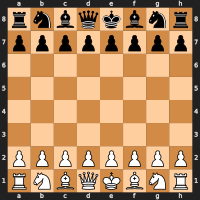

Move 1: You played d2d4


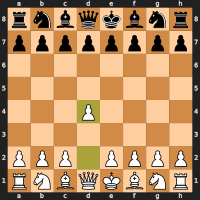

Move 1: AI opponent played g8f6. Evaluation score: -90


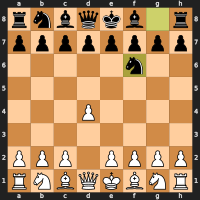

Move 2: You played c2c4


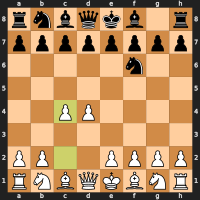

Move 2: AI opponent played e7e5. Evaluation score: -155


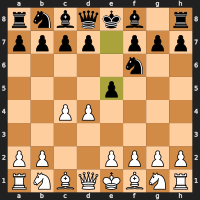

Move 3: You played d4e5


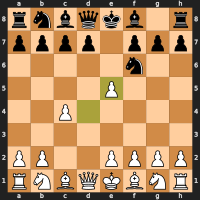

Move 3: AI opponent played f6g4. Evaluation score: -75


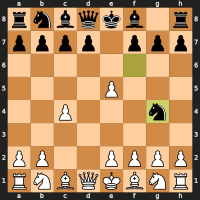

Move 4: You played e2e4


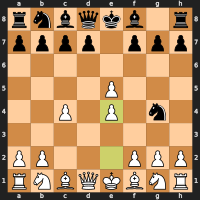

Move 4: AI opponent played f8b4. Evaluation score: -120


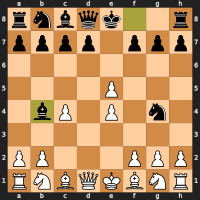

Move 5: You played c1d2


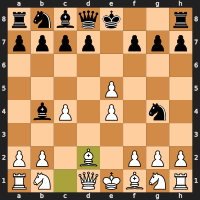

Move 5: AI opponent played b4d2. Evaluation score: -25


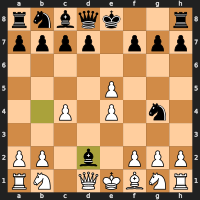

Move 6: You played d1d2


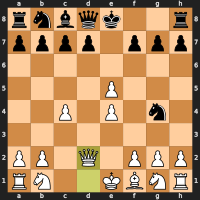

Move 6: AI opponent played g4e5. Evaluation score: -35


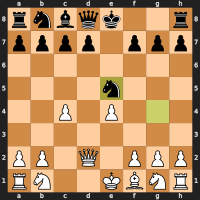

Move 7: You played f2f4


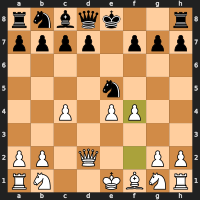

Move 7: AI opponent played d8h4. Evaluation score: -110


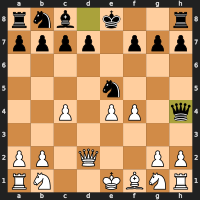

Move 8: You played g2g3


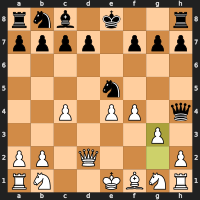

Move 8: AI opponent played h4g4. Evaluation score: 10


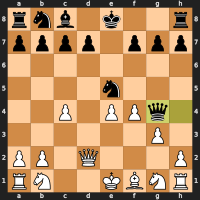

Move 9: You played f1e2


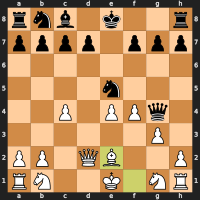

Move 9: AI opponent played g4g6. Evaluation score: -85


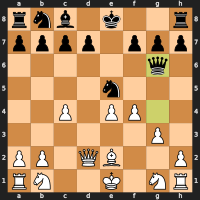

Move 10: You played f4e5


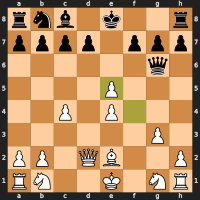

Move 10: AI opponent played g6e4. Evaluation score: -75


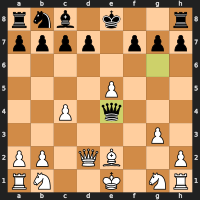

Move 11: You played g1f3


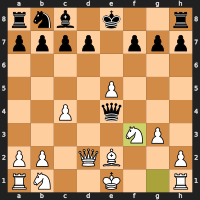

Move 11: AI opponent played b8c6. Evaluation score: -55


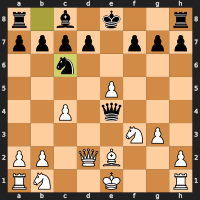

Move 12: You played b1c3


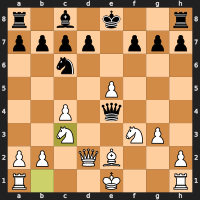

Move 12: AI opponent played e4f5. Evaluation score: 90


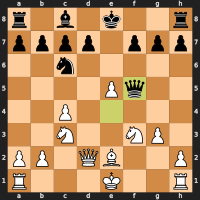

Move 13: You played c3d5


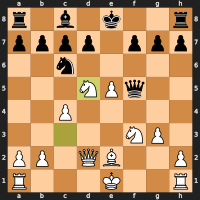

Move 13: AI opponent played e8d8. Evaluation score: 110


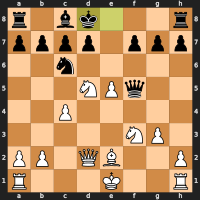

Move 14: You played e1g1


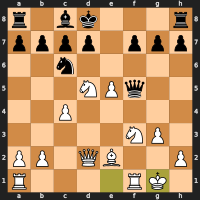

Move 14: AI opponent played c6e5. Evaluation score: 60


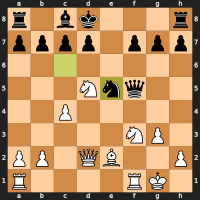

Move 15: You played f3e5


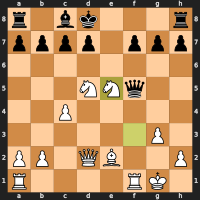

Move 15: AI opponent played f5e5. Evaluation score: 100


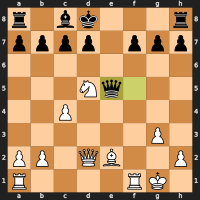

Move 16: You played a1e1


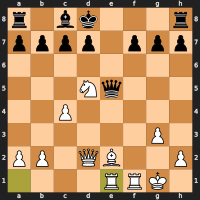

Move 16: AI opponent played e5d6. Evaluation score: 50


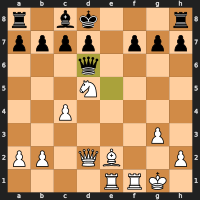

Move 17: You played d2g5


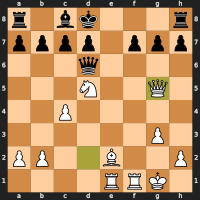

Move 17: AI opponent played f7f6. Evaluation score: -45


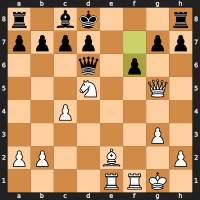

Move 18: You played g5g7


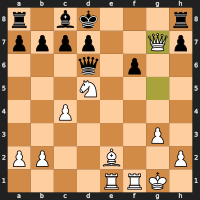

Move 18: AI opponent played h8f8. Evaluation score: 55


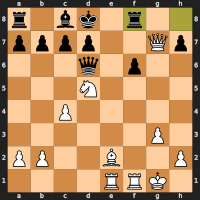

Move 19: You played e1d1


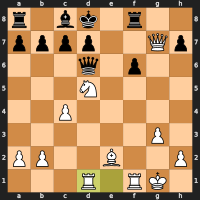

Move 19: AI opponent played d6c5. Evaluation score: 40


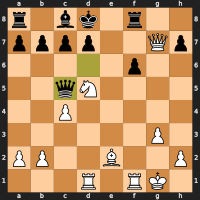

Move 20: You played g1g2


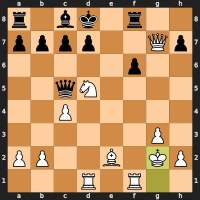

Move 20: AI opponent played b7b5. Evaluation score: 145


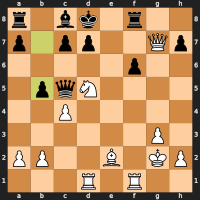

Move 21: You played f1f6


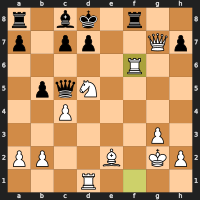

Move 21: AI opponent played f8e8. Evaluation score: 340


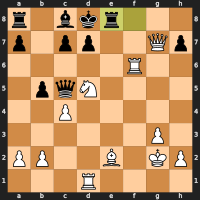

Move 22: You played g7g5


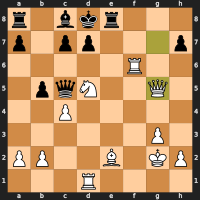

Move 22: AI opponent played e8e2. Evaluation score: 440


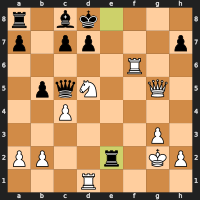

Move 23: You played g2h3


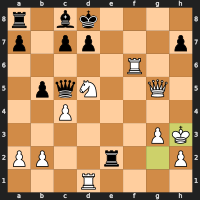

Move 23: AI opponent played d7d6. Evaluation score: 195


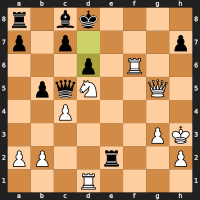

Invalid move: f7 . Please choose a valid move. You can enter 'available moves' to see the available moves.
Invalid move: f6f7. Please choose a valid move. You can enter 'available moves' to see the available moves.
Move 24: You played g3g4


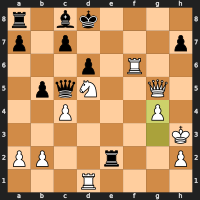

Move 24: AI opponent played e2e3. Evaluation score: 25


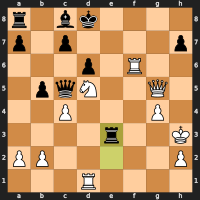

Move 25: You played g5e3


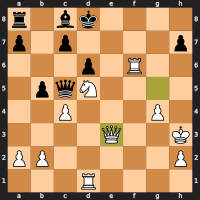

Move 25: AI opponent played c8g4. Evaluation score: -55


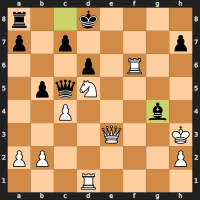

Move 26: You played h3g4


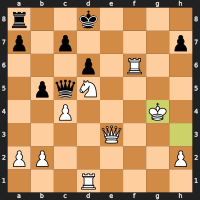

Move 26: AI opponent played c5c4. Evaluation score: 525


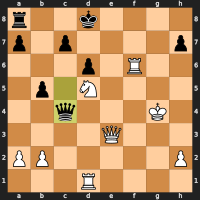

Move 27: You played d1d4


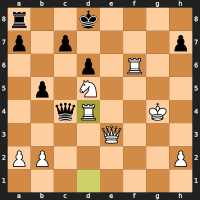

Move 27: AI opponent played c4c5. Evaluation score: 605


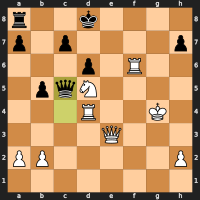

Move 28: You played f6f8


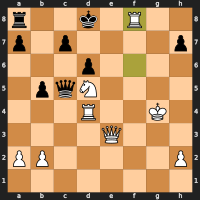

Move 28: AI opponent played d8d7. Evaluation score: 99999


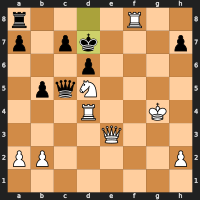

Move 29: You played d5f6


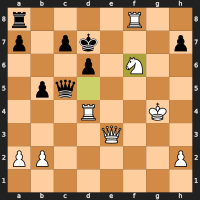

Move 29: AI opponent played d7c6. Evaluation score: 665


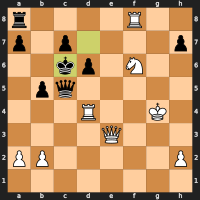

Move 30: You played e3e4


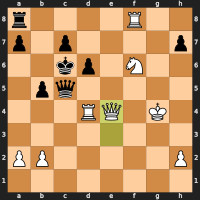

Move 30: AI opponent played d6d5. Evaluation score: 540


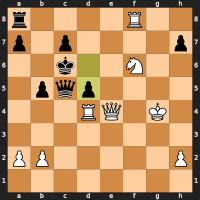

Move 31: You played d4d5


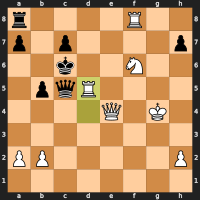

Move 31: AI opponent played c5g1. Evaluation score: 225


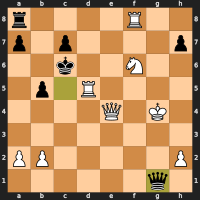

Move 32: You played g4h3


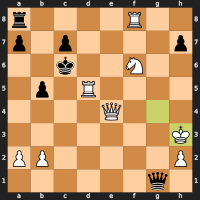

Move 32: AI opponent played g1f1. Evaluation score: 250


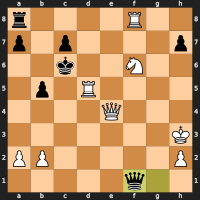

Move 33: You played h3g4


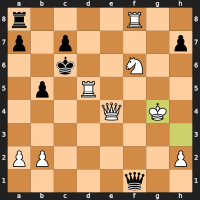

Move 33: AI opponent played f1g1. Evaluation score: 225


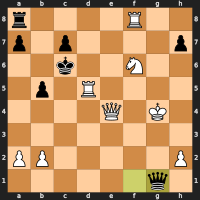

Move 34: You played g4f5


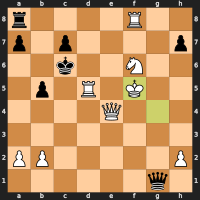

Move 34: AI opponent played g1g6. Evaluation score: 210


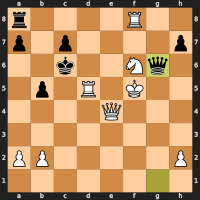

Move 35: You played f5e6


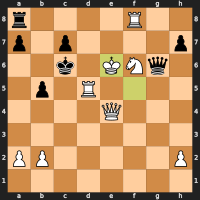

Move 35: AI opponent played g6e4. Evaluation score: 175


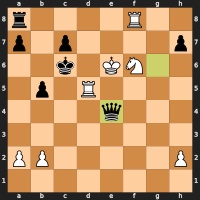

Move 36: You played f6e4


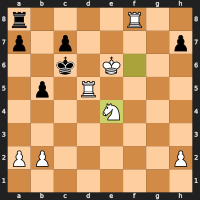

Move 36: AI opponent played a8f8. Evaluation score: 150


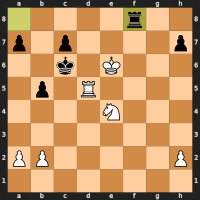

Move 37: You played d5c5


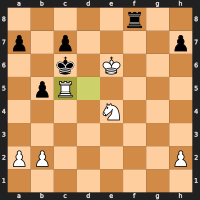

Move 37: AI opponent played c6b6. Evaluation score: 150


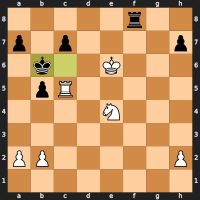

Move 38: You played e6d5


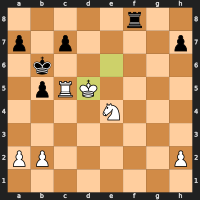

Move 38: AI opponent played f8d8. Evaluation score: -110


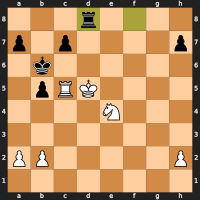

Move 39: You played d5e6


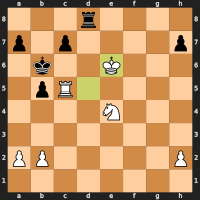

Move 39: AI opponent played b5b4. Evaluation score: -115


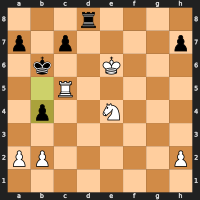

Move 40: You played e6e7


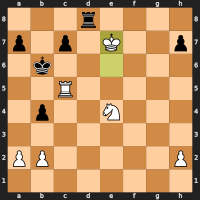

Move 40: AI opponent played d8d4. Evaluation score: 140


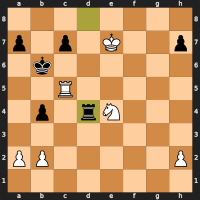

Move 41: You played c5e5


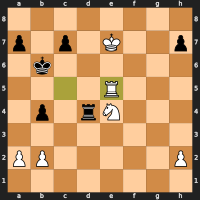

Move 41: AI opponent played c7c6. Evaluation score: 130


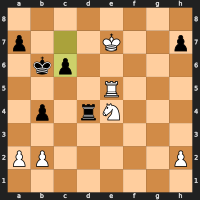

Move 42: You played h2h4


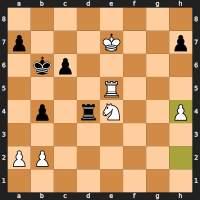

Move 42: AI opponent played a7a6. Evaluation score: 70


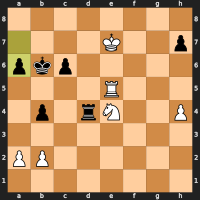

Move 43: You played a2a3


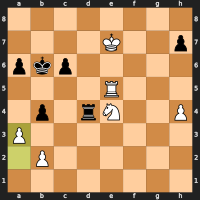

Move 43: AI opponent played b4a3. Evaluation score: 55


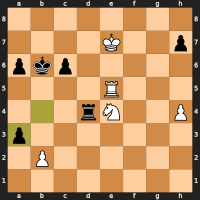

Move 44: You played b2a3


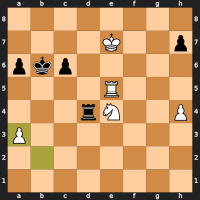

Move 44: AI opponent played d4c4. Evaluation score: 100


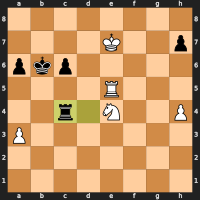

Move 45: You played h4h5


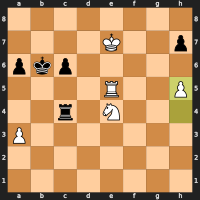

Move 45: AI opponent played c4a4. Evaluation score: 105


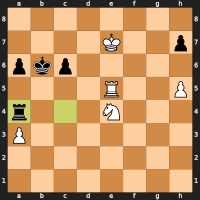

Move 46: You played h5h6


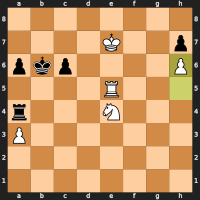

Move 46: AI opponent played a4a3. Evaluation score: 85


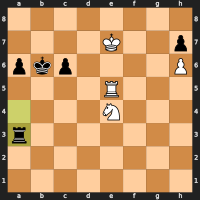

Move 47: You played e5h5


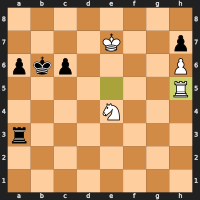

Move 47: AI opponent played a3e3. Evaluation score: -250


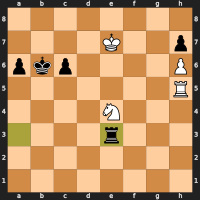

Move 48: You played e7d6


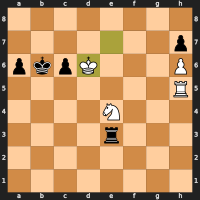

Move 48: AI opponent played e3e4. Evaluation score: -265


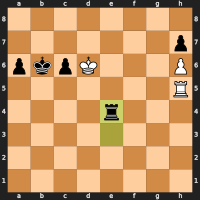

Last move undone. Current state of the board:


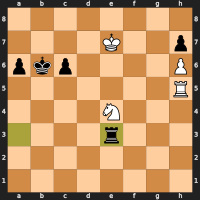

Move 48: You played h5h4


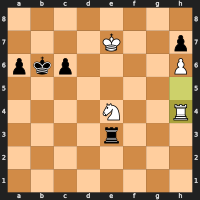

Move 48: AI opponent played b6c7. Evaluation score: 40


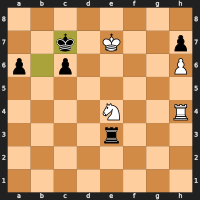

Move 49: You played e7f6


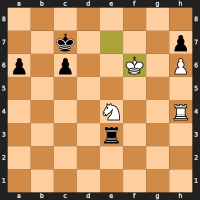

Move 49: AI opponent played e3f3. Evaluation score: 50


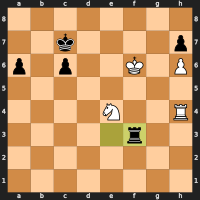

Move 50: You played f6g5


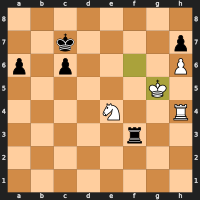

Move 50: AI opponent played c7b8. Evaluation score: 60


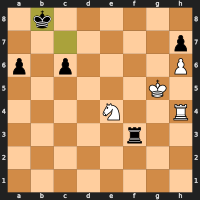

Move 51: You played e4f6


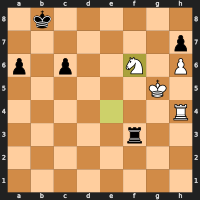

Move 51: AI opponent played a6a5. Evaluation score: 65


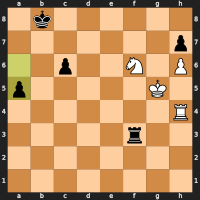

Move 52: You played f6h7


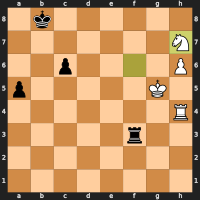

Move 52: AI opponent played f3d3. Evaluation score: 120


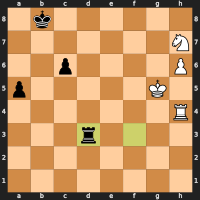

Move 53: You played h7f6


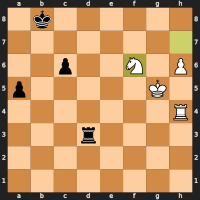

Move 53: AI opponent played d3g3. Evaluation score: 165


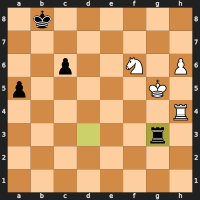

Move 54: You played g5h5


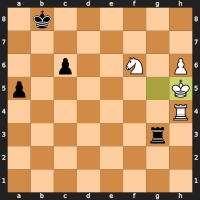

Move 54: AI opponent played g3f3. Evaluation score: 175


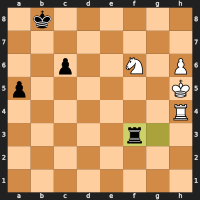

Move 55: You played h5g6


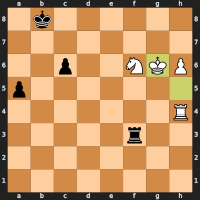

Move 55: AI opponent played f3g3. Evaluation score: 165


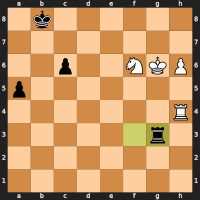

Move 56: You played g6f7


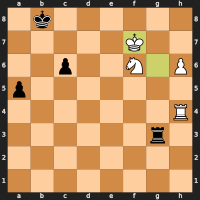

Move 56: AI opponent played g3b3. Evaluation score: 165


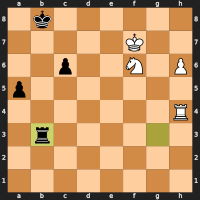

Move 57: You played h6h7


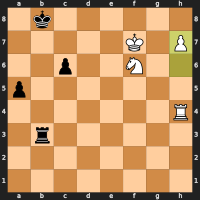

Move 57: AI opponent played b3b7. Evaluation score: 545


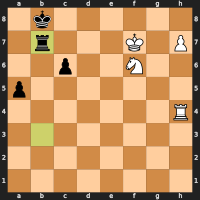

Move 58: You played f7e6


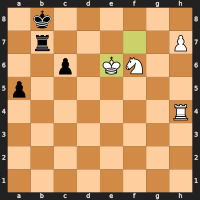

Move 58: AI opponent played b7h7. Evaluation score: 540


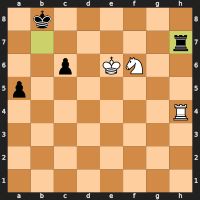

Move 59: You played h4h7


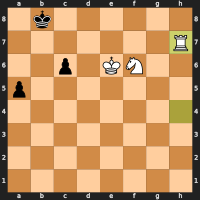

Move 59: AI opponent played a5a4. Evaluation score: 595


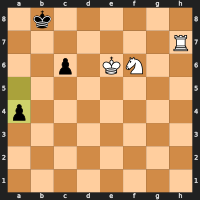

Move 60: You played f6e4


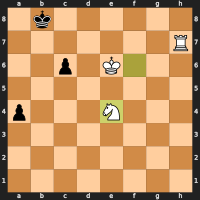

Move 60: AI opponent played a4a3. Evaluation score: 545


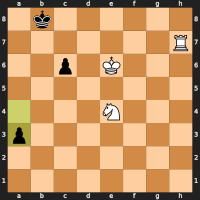

Move 61: You played e4c3


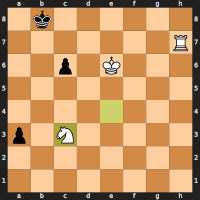

Move 61: AI opponent played c6c5. Evaluation score: 575


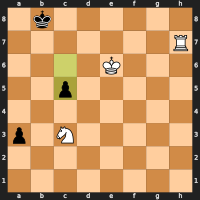

Move 62: You played e6d6


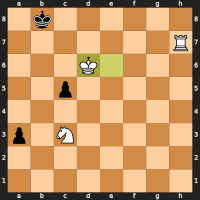

Move 62: AI opponent played c5c4. Evaluation score: 575


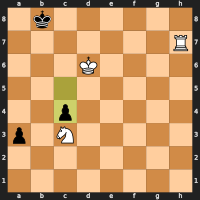

Move 63: You played d6c6


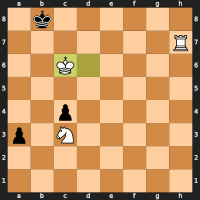

Move 63: AI opponent played a3a2. Evaluation score: 635


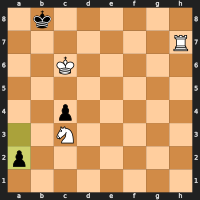

Move 64: You played c3a2


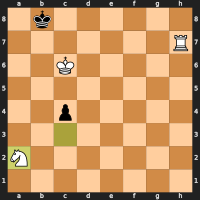

Move 64: AI opponent played c4c3. Evaluation score: 780


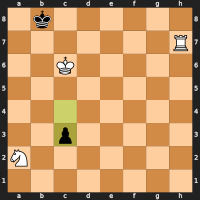

Move 65: You played a2c3


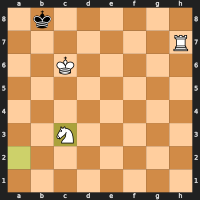

Move 65: AI opponent played b8c8. Evaluation score: 99999


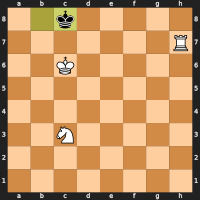

Move 66: You played h7h8


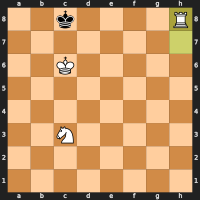

Checkmate! White won.
Number of positions evaluated by the AI:  15044437


In [50]:
if __name__ == "__main__":
    run_chess_game(ai_opponent_move=ai_opponent_minimax_with_pruning_move,
                   evaluate_board_function=evaluate_board_improved,
                   depth=5,
                   show_num_positions_evaluated=True,
                   print_moves=True,
                   show_board=True)

As we can see, the chess engine plays really well. Although I still beat it, it took 67 moves for me to checkmate. However, I did miss a forcing checkmate sequence which allowed the chess engine to bounce back. Just by this, we can see that we have already satisfied what we wanted to make, a chess engine quite enjoyable to play against. I would estimate that it has an ELO of around 1500-1600. 


However, there still exist areas for improvement that can be split in different categories. 

## Improvements

#### Improving speed:

Hardware based:
* Rewriting the program with C, C++ or Cython would be a good idea to give an absolute decrease in the time needed to execute the program. This is because Python is an interpreted language and thus is slower than C or C++ which are compiled languages. 
* Investigate the possibility of parallelization. Currently, the program is single threaded and thus can only use one core. However, we can use multiple cores to speed up the program.
* Better hardware specifications. The faster our CPU is the faster it will execute the program. 

Sofware based / AI-logic based: 
* Use a lookup table to store the evaluation of different positions for different depths, analogous to a pattern database I used in the previous project. This way, we do not have to calculate the evaluation of the same position multiple times but can look and see if it is already hashed (O(1) lookup) and if it is, we significantly save time. This is great since there are some frequently occurring positions especially at the beginning of the game. This, of course, comes at a great cost of memory.
* We can try to improve the alpha-beta pruning by increasing the likeliness that the program finds the optimal route at the beginning. This is generally referred as move ordering and our aim is to preferentially search the best moves first. The most common heuristic is the *killer-move heuristic* which is the idea that if a particular move was strong enough to cause a beta-cutoff (forcing an opponent to choose a different move) in one part of the search tree, then it is likely to be a strong move in other similar positions as well. By considering these "killer moves" first in the search, the algorithm can potentially reach a cutoff more quickly, reducing the time spent exploring less promising branches of the search tree.
* Since our AI engine has a depth limit, it can suffer the *horizon effect* since it can miss important calculations that are just beyond its depth. That is why we sometimes saw the engine thinking the exchange is favourable (but they just did not look deep enough) or it did not choose a favourable exchange. We can potentially fix this by implementing **quiescence search**. This means that the engine will be able to perform a "limited" secondary search on certain positions that are deemed *unstable* until they are labelled as *stable*. Now, we could label *unstable* positions as the ones where piece exchanges and captures have happened and since these positions have the higher potential, we will firstly explore them and explore them until they become stable. This should improve the strength of our chess engine significantly.


#### Improving evaluation function:
* Add the number of legal moves as an additional part of the evaluation function. More legal moves means more options and thus more potential for a better outcome so it should be a positive value.
* Add the number of checks as an additional part of the evaluation function. More checks means more potential for a better outcome so it should be a positive value.
* Today's chess engines don't "think through" the first moves of the game but rather play standard theory openings. Thus, we can add an opening theory book meaning that the engine will play opening theory for as long as is possible (until the opponent deviates from it). This will allow the engine to play better openings and thus have a better position to work with.
* One could see that the AI engine struggled slightly with the endgame. Add Syzygy endgame tables to the evaluation function. This is a table of all endgame positions (whern there are 3,4,5,6 pieces) that are known to be drawn or won that give the exact sequence of steps the engine has to play to play them perfectly. This would increase the endgame speed tremendously, once again at the expense of memory. 7 piece engame book is more than 15TB in size. 
* One simple issue is that the king in the endgame does not go towards the middle, which is generally the principle that should be followed and something different to when there are a lot of pieces on the board. We can fix this by detecting when the endgame is reached and then change the evaluation function to prefer the king to go towards the middle (adopted from the chessprogramming wiki):

In [ ]:
"""
-50,-40,-30,-20,-20,-30,-40,-50,
-30,-20,-10,  0,  0,-10,-20,-30,
-30,-10, 20, 30, 30, 20,-10,-30,
-30,-10, 30, 40, 40, 30,-10,-30,
-30,-10, 30, 40, 40, 30,-10,-30,
-30,-10, 20, 30, 30, 20,-10,-30,
-30,-30,  0,  0,  0,  0,-30,-30,
-50,-30,-30,-30,-30,-30,-30,-50
"""

### AI use
No AI has been used to aid in completion of this project.

# HC use

I would like to point out my use of 2 HCs in this project:

Explains or justifies the appropriate identification and use of characteristics distinctive to a communicative and expressive medium; (when applicable) effectively evaluates the appropriateness or effectiveness of medium-specific features used by others and provides justification for the evaluation.
* **#multimedia**: All throughout this paper I tried to identify the best possible ways to present the information in a way that is easy to understand and follow given the constraints of using such a medium (and having to submit a PDF). Although a GUI would have been really nice, I wrote code that gave a better output that is easier to follow through a PDF that is highly informative and enjoyable for the reader to look at. I found a library and tweaked with it for it to be able to generate SVG visualizations of the board which I edited to be the clearest possible for my reader (most used color scheme, highlight the last move (from which square it came and to which), write the move out, etc.). This is much superior to the way most others do it (by just printing a board that does not have any of the highly visually appearing features of mien). I also used informative images and diagrams to explain the concepts and I used different colours to highlight important information (different colours for different players, underlining, crossing out unexplored nodes, etc.).
* **#optimization**: This is perhaps the most important HC and one that underlines pretty much all of the choices made in this project. From one side, I had the optimization of accuracy, which was measure through the evaluation function and the chosen algorithm. On the other, equally important side, was the time complexity optimization. This is what also decided between going between the algorithms that Leela Chess engine uses and what Stockfish uses. All throughout the project, we kept maximizing and optimizing the time efficiency and in certian cases discussed tradeoffs between time efficiency and memory, as well as partially accuracy. Specific Big O complexities were discussed as well.
* **#heuristics**: Heuristics was another fundamental HC used in this paper as the minimax algorithm directly relied on different heuristics. We used human knowledge of chess, our intuition and reasoning to develop different heuristics that would help us evaluate the position and make the best possible move. I started from the materialistic heuristics function that weighed the importance of each piece and summed them giving us the tactical understanding when conjoined with minimax. Later, I improved the heuristic by adding the positional value tables giving the heuristic a positional understanding, which by itself gave phenomenal results. Finally, I suggested several simple ways these heuristics can be improved.